In [1]:
import numpy as np
import astropy
import matplotlib.pyplot as plt
import scipy.stats as stats
import pandas as pd
import glob
import pickle
from astropy.table import Table
import lmfit
from lmfit.models import VoigtModel
from scipy.interpolate import interp1d
from PyAstronomy import pyasl

import sys
from tqdm import tqdm
from astropy.io import fits
import scipy
sys.path.append('../../../wdtools/')
import wdtools
sys.path.append('../../../')
import WD_models
from bisect import bisect_left
import lmfit
from scipy.ndimage import gaussian_filter

halpha = 6564.61
hbeta = 4862.68
speed_light = 299792458


na1 = 5889.6
na2 = 5895.7

mg = 5176.7

ca1 = 8500.36
ca2 = 8544.44
ca3 = 8664.52

ca2k = 3934.777

ch = 4302

plt.rcParams.update({'font.size': 18})
#%matplotlib inline
from matplotlib.colors import LogNorm

Using TensorFlow backend.
/Users/vedantchandra/opt/anaconda3/envs/metalpoor/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/vedantchandra/opt/anaconda3/envs/metalpoor/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/vedantchandra/opt/anaconda3/envs/metalpoor/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([(

In [16]:
lamgrid = np.arange(3700, 9000)
sigma = 1 # Angstrom
convolve = True

In [17]:
sp = wdtools.SpecTools()

def get_spectrum(source_id):
    path = '../../spec/'+str(source_id)+'_spec_0.fits'
    try:
        with fits.open(path) as f:
            flux = f[1].data['flux']
            loglam = f[1].data['loglam']
            fluxsig = f[1].data['ivar']
            lam = 10**loglam
            f.close()
    except:
        #raise FileNotFoundError('Spectrum file missing...')
        return np.nan, np.nan
    ## RV Correction and Interpolation
    
    return lam, flux

def cont_norm(wl, fl, centre, window, edge):
    c1 = bisect_left(wl, centre - window)
    c2 = bisect_left(wl, centre + window)
    wl, fl = wl[c1:c2], fl[c1:c2]
    
    mask = np.ones(len(wl))
    mask[edge:-edge] = 0
    mask = mask.astype(bool)

    p = np.polynomial.polynomial.polyfit(wl[mask], fl[mask], 1)
    continuum = np.polynomial.polynomial.polyval(wl, p)
    norm_fl = fl / continuum
    return wl, norm_fl

def rv_corr(wl, fl):
    obs_alpha,_,_, _, _ = sp.find_centroid(wl, fl, halpha, make_plot = False, n_fit = 2, 
                            half_window = 50, debug = False, window_step = 5)

    vr = - 1e-3 * speed_light * (obs_alpha - halpha)/halpha

    fl, shift_wl = pyasl.dopplerShift(wl, fl, vr, edgeHandling = 'fillValue', fillValue = 1)
    return wl, fl

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def logg_to_radius(logg):
    g = 10**logg * 0.01 # to SI
    
    R = radius_sun * 10 ** ( - ((np.log10(g / g_sun) + 0.02) / 0.67))
    return R

interpsda = pickle.load(open('interp/interp_phx.p', 'rb'))

def get_sda(teff, logg, feh, alpha = 0, sigma = 1):
    wl, fl = lamgrid, 10**interpsda((logg, np.log10(teff), feh, np.log(lamgrid)))
    
    if convolve:
        fl = scipy.ndimage.gaussian_filter(fl, sigma)
    return wl, fl

def plot_metals(wl, fl, source = '', teff = 6000, logg = 4.5, feh = -3.5, alpha = 0):
    
    modelwl, modelfl = get_sda(teff, logg, feh = feh, alpha = alpha)
    
    f = plt.figure(figsize = (10, 15))
    gs = f.add_gridspec(4, 2)
    
    ax1 = f.add_subplot(gs[0, :])
    
    
    idx = bisect_left(wl, 5865)
    plt.plot(wl, fl / fl[idx])
    #plt.title(str(obj['source_id'][0]) + ' (%i, %.1f)'%(teff, logg))
    
    ax2 = f.add_subplot(gs[1, 0])
    
    cwl, cfl = cont_norm(wl, fl, ca2k, 20, 5)
    plt.plot(cwl, cfl)
    cwl, cfl = cont_norm(modelwl, modelfl, ca2k, 20, 5)
    plt.plot(cwl, cfl)
    #plt.xlim(3925, 3940)
    plt.axvline(ca2k, linestyle = '-', color = 'k', linewidth = 0.5)
    plt.title('Ca II K')
    plt.ylim(0.5, 1.3)
    
    
    ax3 = f.add_subplot(gs[1,1])

    
    cwl, cfl = cont_norm(wl, fl, na2, 75, 15)
    plt.plot(cwl, cfl)
    cwl, cfl = cont_norm(modelwl, modelfl, na2, 75, 15)
    plt.plot(cwl, cfl)
#     plt.axvline(na1, linestyle = '-', color = 'k', linewidth = 0.5)
#     plt.axvline(na2, linestyle = '-', color = 'k', linewidth = 0.5)
    plt.ylim(0.5, 1.3)
    plt.title('Na')
    
    ax4 = f.add_subplot(gs[2,0])
    
    cwl, cfl = cont_norm(wl, fl, ca2, 400, 25)
    plt.plot(cwl, cfl)
    cwl, cfl = cont_norm(modelwl, modelfl, ca2, 400, 25)
    plt.plot(cwl, cfl)
    plt.xlim(ca1-25, ca3+25)
#     plt.axvline(ca1, linestyle = '-', color = 'k', linewidth = 0.5)
#     plt.axvline(ca2, linestyle = '-', color = 'k', linewidth = 0.5)
#     plt.axvline(ca3, linestyle = '-', color = 'k', linewidth = 0.5)
    plt.ylim(0.5, 1.3)
    plt.title('Ca Triplet')
    
    ax5 = f.add_subplot(gs[2,1])
    
    cwl, cfl = cont_norm(wl, fl, ch, 26, 5)
    plt.plot(cwl, cfl)
    cwl, cfl = cont_norm(modelwl, modelfl, ch, 26, 5)
    plt.plot(cwl, cfl)
   # plt.xlim(ca1-20, ca3+20)
    plt.ylim(0.5, 1.3)
    plt.title('CH G-Band')
    
    ax6 = f.add_subplot(gs[3,0])
    
    cwl, cfl = cont_norm(wl, fl, 4320, 30, 5)
    plt.plot(cwl, cfl)
    cwl, cfl = cont_norm(modelwl, modelfl, 4320, 30, 5)
    plt.plot(cwl, cfl)
   # plt.xlim(ca1-20, ca3+20)
    plt.ylim(0.5, 1.3)
    plt.title('Carbon')
    
    ax6 = f.add_subplot(gs[3,1])
    
    cwl, cfl = cont_norm(wl, fl, hbeta, 50, 10)
    plt.plot(cwl, cfl)
    cwl, cfl = cont_norm(modelwl, modelfl, hbeta, 50, 10)
    plt.plot(cwl, cfl)
    plt.axvline(hbeta, linestyle = '-', color = 'k', linewidth = 0.5)
    plt.ylim(0.1, 1.3)
    plt.title('H-Beta')
    
    
    
    plt.tight_layout()
#     plt.savefig('mp_stars/' + str(source) + '.png', bbox_inches = 'tight')

### Get Fitted EW Table

In [4]:
table = Table.read('tables/feh_table.fits')

# clean = (

# )
# print(len(table))
# table = table[clean]
# print(len(table))

/Users/vedantchandra/opt/anaconda3/envs/metalpoor/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/vedantchandra/opt/anaconda3/envs/metalpoor/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


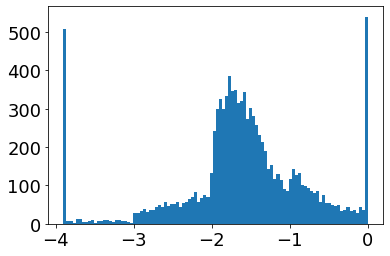

In [5]:
plt.hist(table['spec_feh'], bins =100);

## Explore Data

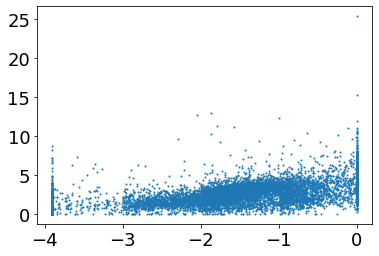

In [6]:
plt.scatter(table['spec_feh'], table['ca2k'], s = 1)

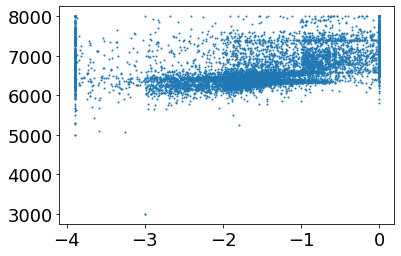

In [7]:
plt.scatter(table['spec_feh'], table['spec_teff'] , s = 1)

In [8]:
kepler_da = np.array(['D' in ty for ty in table['ty']])
phot_class = (table['p_spec'] > 0.5) * (table['g'] < 17.5)

print(sum(kepler_da))
print(sum(phot_class))
sum(kepler_da*phot_class)

478
4943


0

# EMP Selection

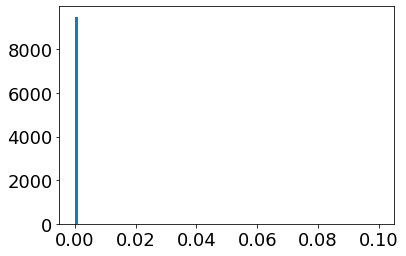

In [9]:
plt.hist(table['chisqr'], bins = 100, range = (0, 0.1));

In [14]:
emp = (
    (table['spec_feh'] < -3.5)*
    (table['spec_logg'] < 5.45)*
    (table['chisqr'] < 0.1)*
    (table['spec_teff'] > 3000)*
    (table['spec_logg'] > 3.75)*
    (table['g'] < 20)
)

print(len(table[emp]))

65


--------------------------------------------------
3662979179269883008
203.85096349943464 0.11209499287057277
0.42544305
sdA/F
18.62
7034.242972589094 4.025039816100619 -3.8999999998951047


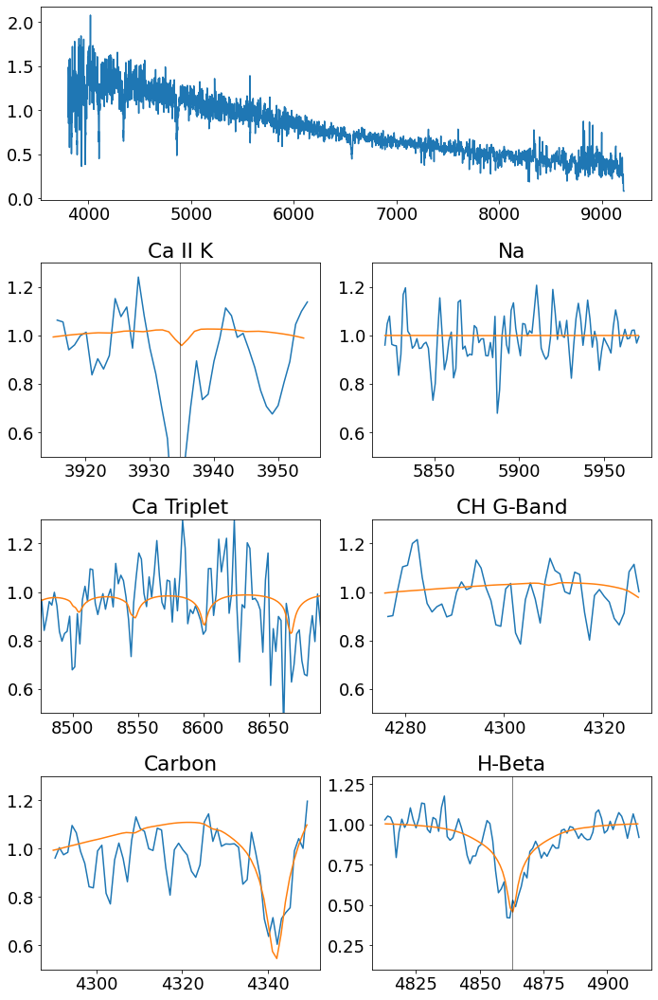

--------------------------------------------------
3679017514865905792
194.09295136781205 -3.633687981607951
2.0319214
sdA
17.475
7369.210510197285 3.9999876562666112 -3.7210128465560026


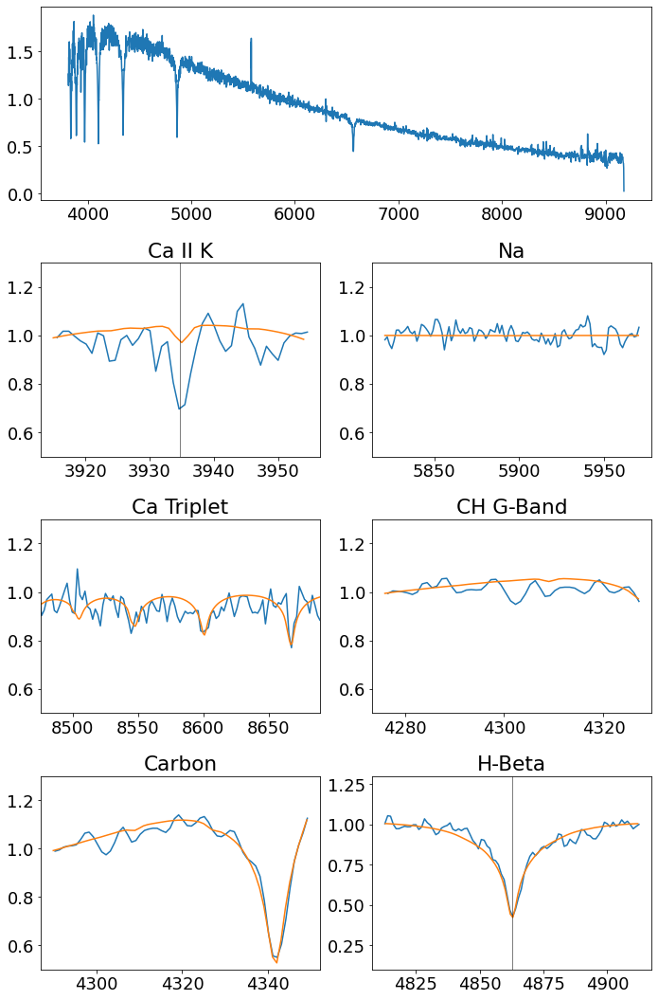

--------------------------------------------------
2640993635331678080
355.26777788159563 -1.2218496037000701
2.7449157
sdA/F
18.762
6616.932086987118 4.017078910653618 -3.8999999998951047


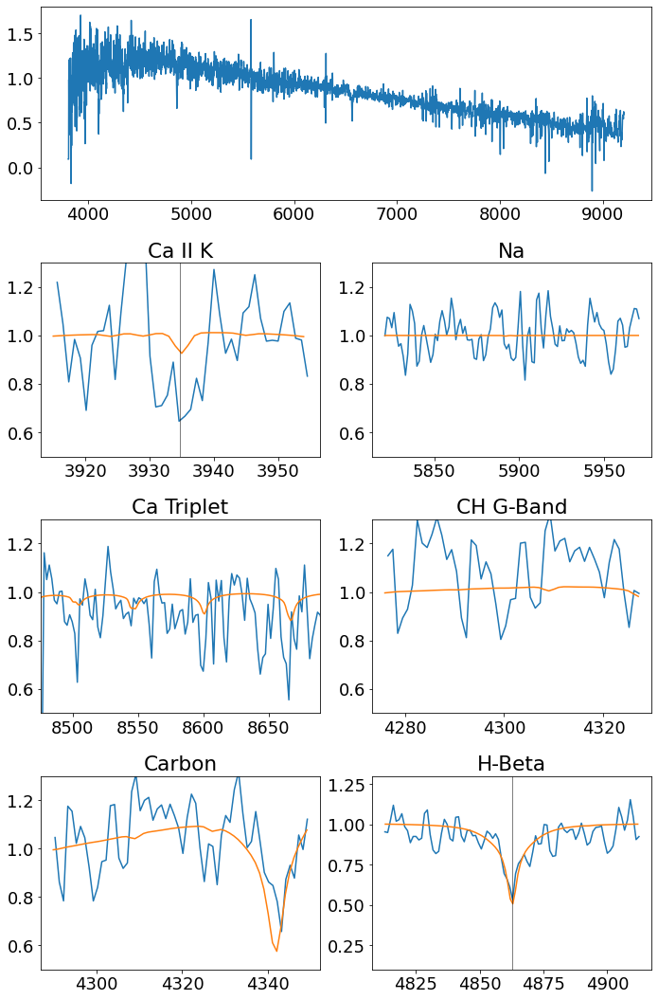

--------------------------------------------------
3244333667363506304
56.41542662213615 -6.696356833625427
19.49812
sdA
18.599
6948.956890696183 3.9999959946267545 -3.8999999998951047


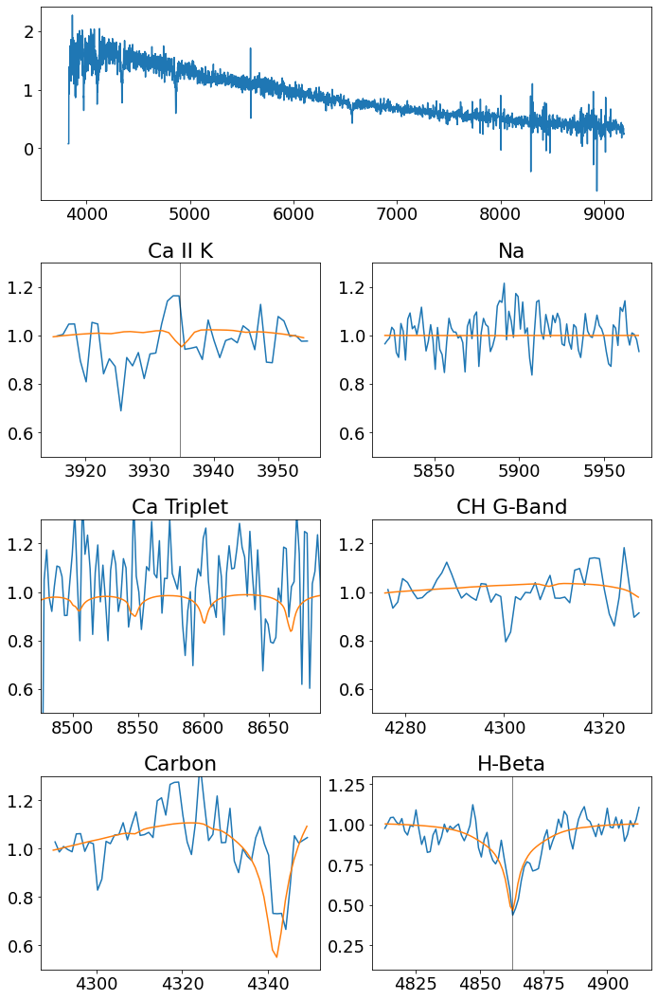

--------------------------------------------------
3855976042976592384
158.62707054049835 2.4251605544882278
15.558717
DA
18.692
6733.594898039668 4.243315337575628 -3.8999999998951047


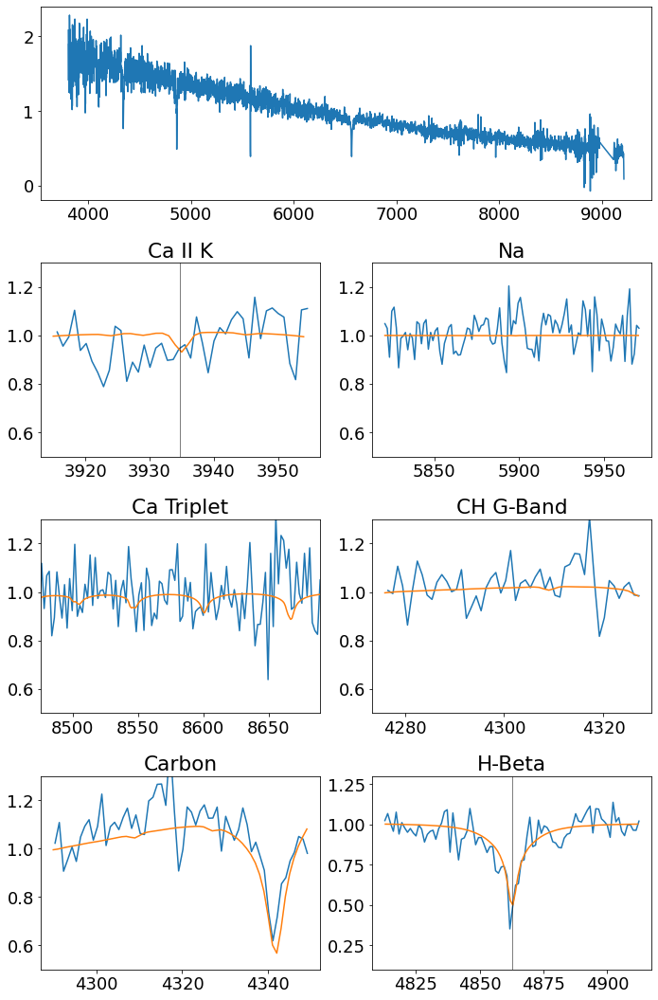

--------------------------------------------------
3711504926666174848
202.75302792525818 2.025973159561194
2.6972768
sdA/F
18.064
6442.091398182274 4.500006699768725 -3.6494006094667157


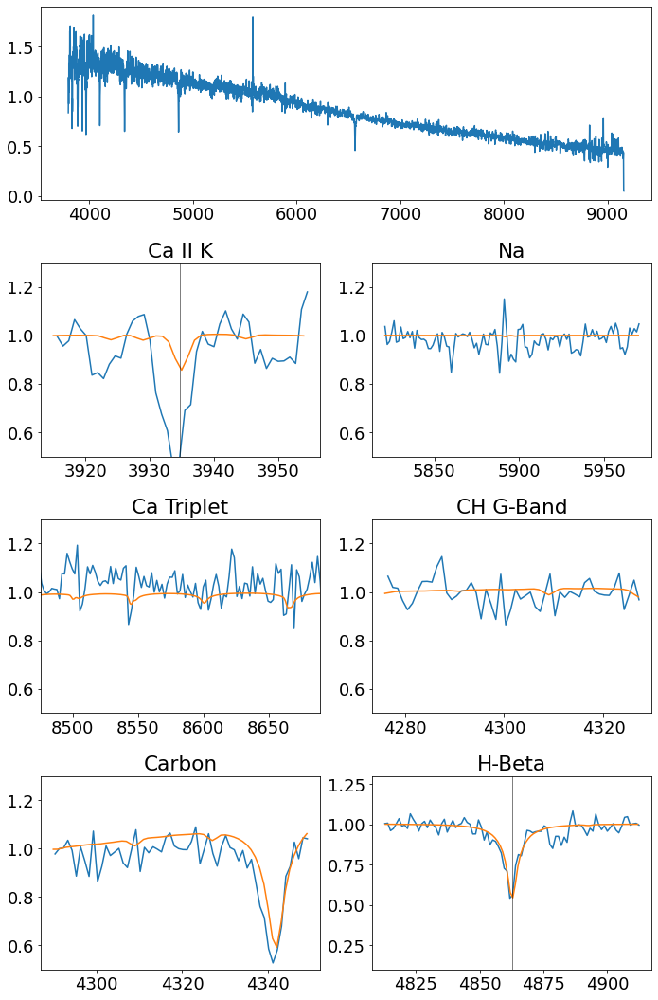

--------------------------------------------------
3648628697101262848
221.6582936251727 -2.7782711438701604
0.20333356
sdA/F
18.761
6305.291190020343 4.532869986192097 -3.8999999998951047


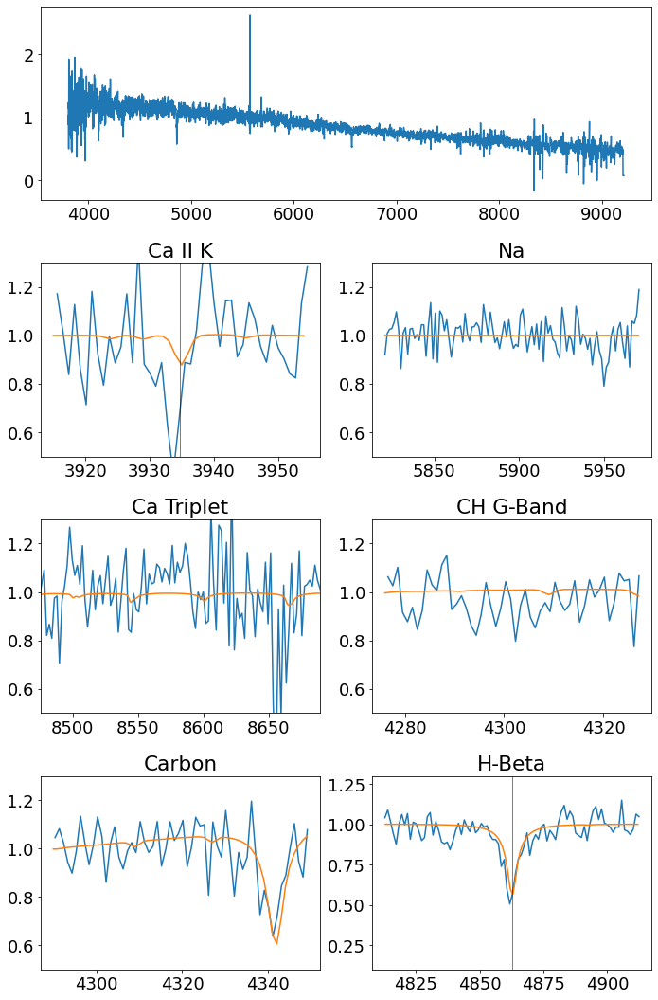

--------------------------------------------------
2642964028888375936
355.9420914179266 0.5648925646250585
0.75489736
sdA/F
19.374000000000002
6535.072594804555 4.247041612371092 -3.7446429569572683


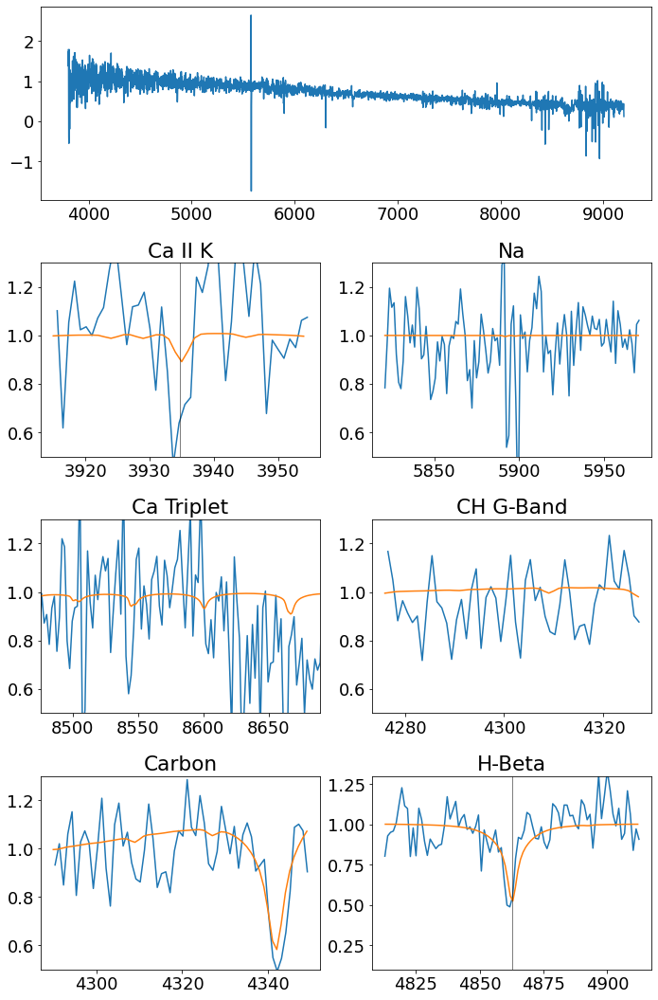

--------------------------------------------------
3092216989574463616
126.3387537630003 4.059484006761043
1.1233724
sdA
17.061
6412.5187688554415 3.816348655192272 -3.8999999998951047


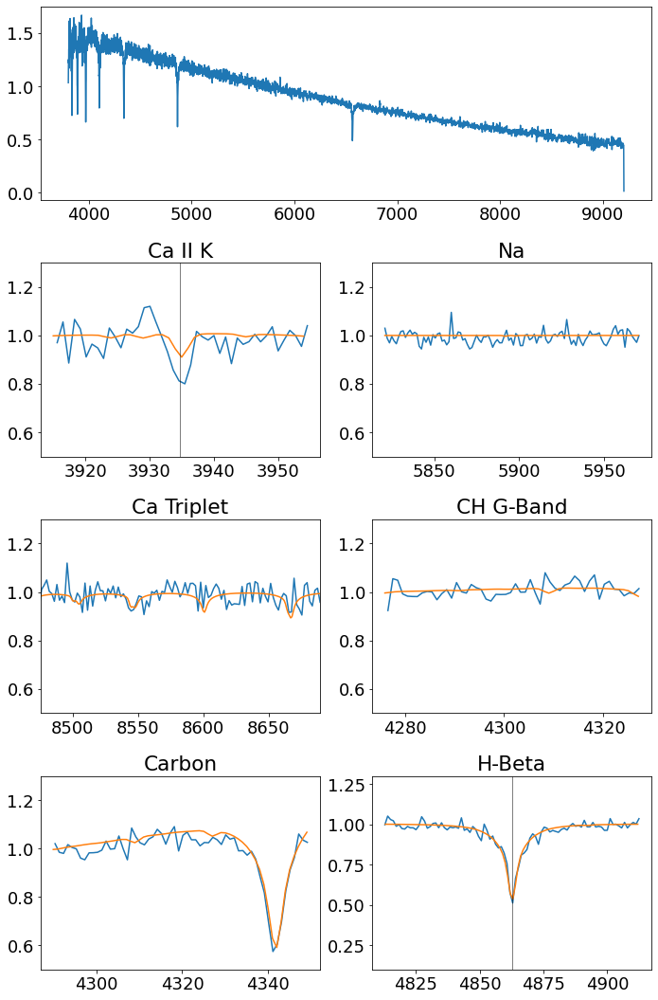

--------------------------------------------------
681934703732973824
121.99129989629529 25.95274590318084
35.105156
sdA
18.78
6042.794009505749 4.210702405749056 -3.8999999998951047


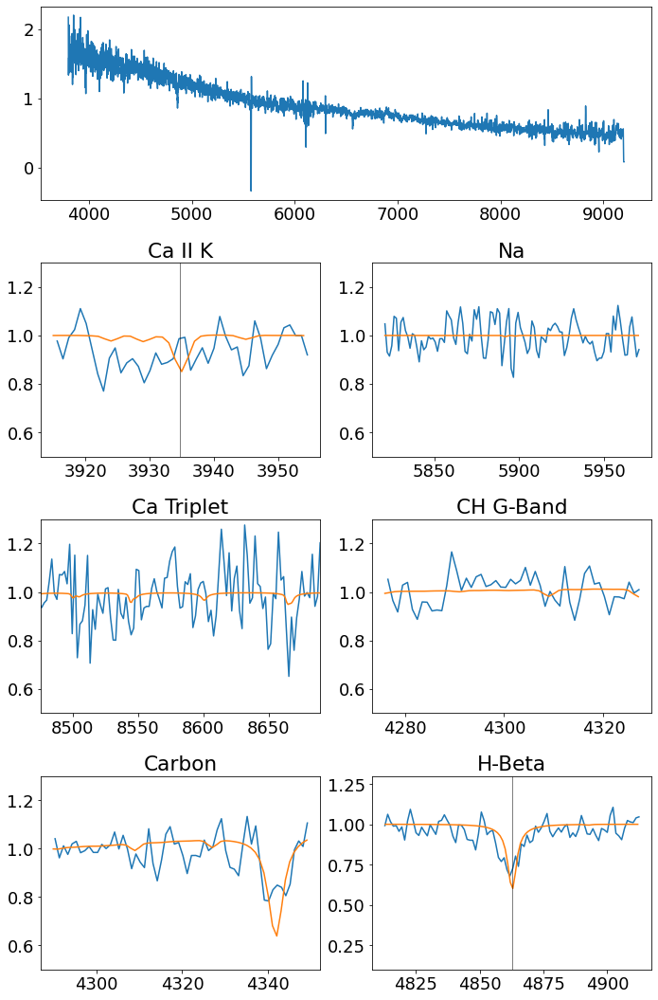

--------------------------------------------------
164453236908889984
64.2643663733093 27.715130826950407
18.368544
sdA
16.282
7113.312092539008 3.9999873803127945 -3.611174567372708


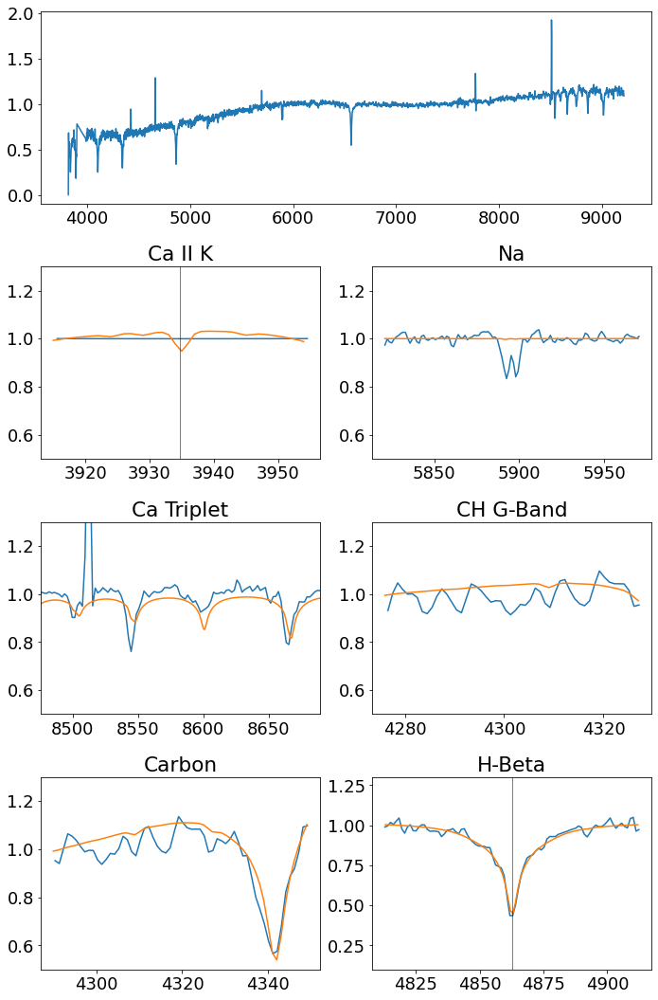

--------------------------------------------------
164438393501814656
64.92125558220752 28.006999596513154
3.8069115
sdA/F
17.414
6627.982299933722 4.500010249263603 -3.645997966508257


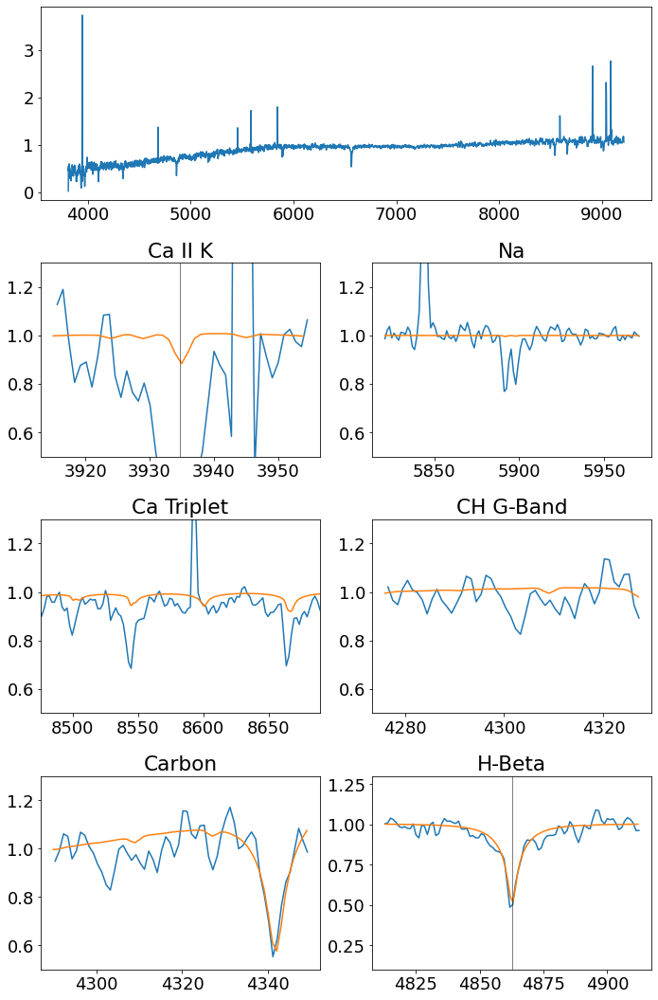

--------------------------------------------------
164453236908889984
64.2643663733093 27.715130826950407
18.368544
sdA
16.282
7113.312092539008 3.9999873803127945 -3.611174567372708


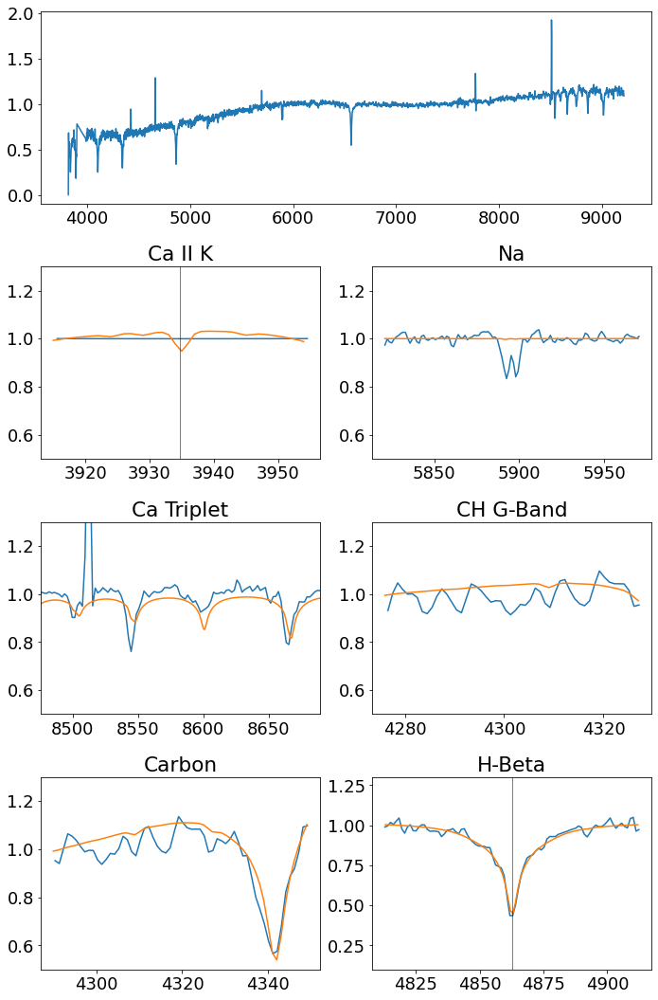

--------------------------------------------------
1278902967098505088
230.49408863061876 34.624823484392685
7.212346
sdA/F
16.9
6191.342770896295 4.124895430999603 -3.5229680415351012


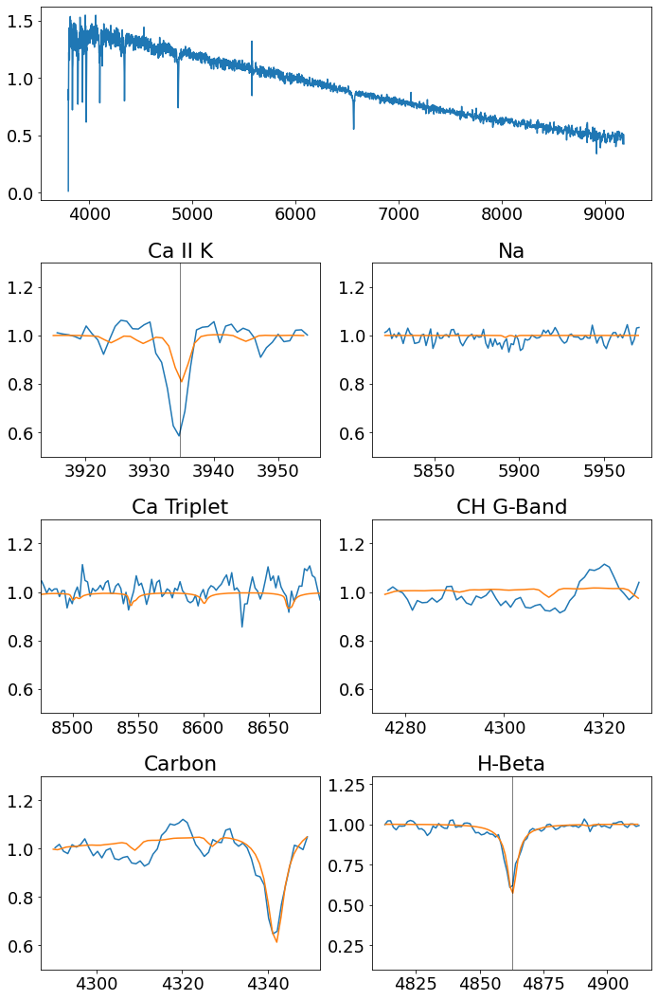

--------------------------------------------------
3724067121891339648
211.82550433438772 10.505470323809265
3.2758822
sdA/F
16.942999999999998
6407.686600626186 4.246039370746098 -3.8999999998951047


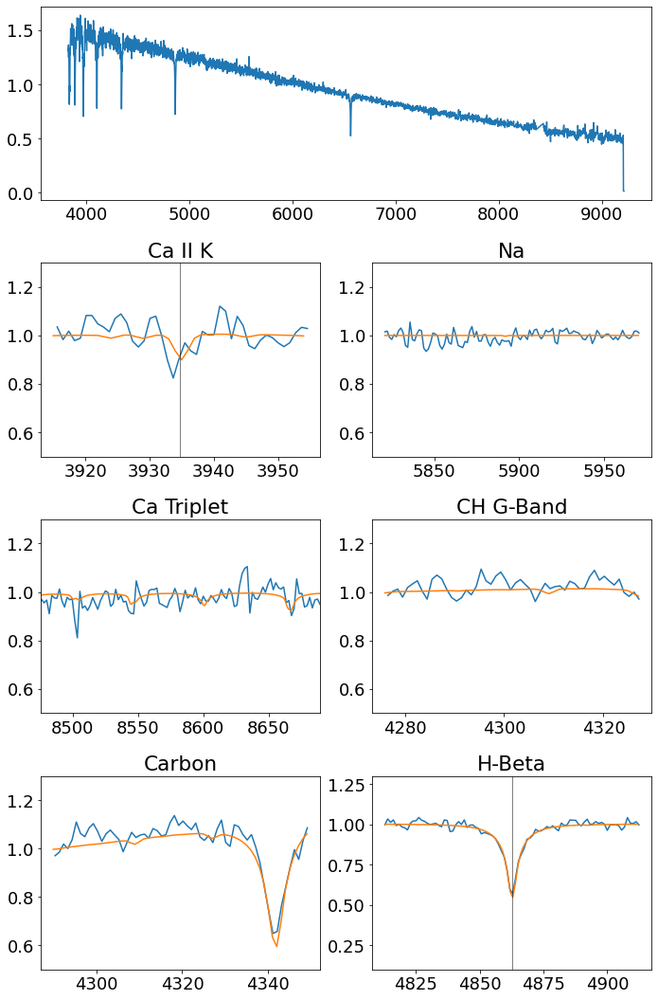

--------------------------------------------------
1164237403402081920
233.67394913423763 7.81504241129063
36.885944
DA
18.352
6712.210023706057 4.423262165066594 -3.8999999998951047


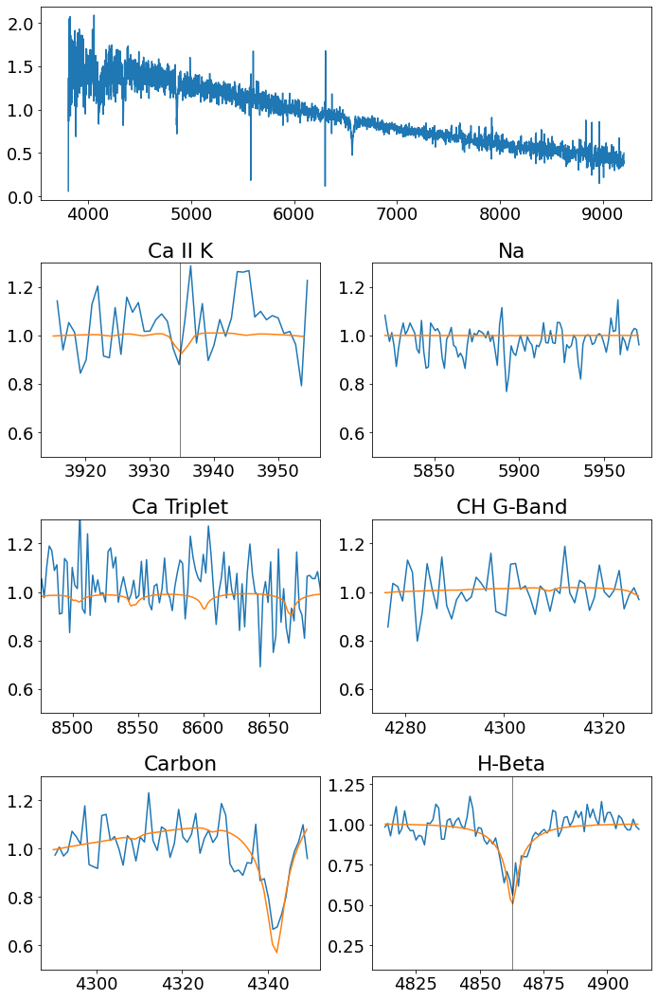

--------------------------------------------------
900178141119592192
112.35209134389802 39.05844510280654
10.89208
DA
19.871
7459.188672500325 4.782885235196021 -3.88015108181622


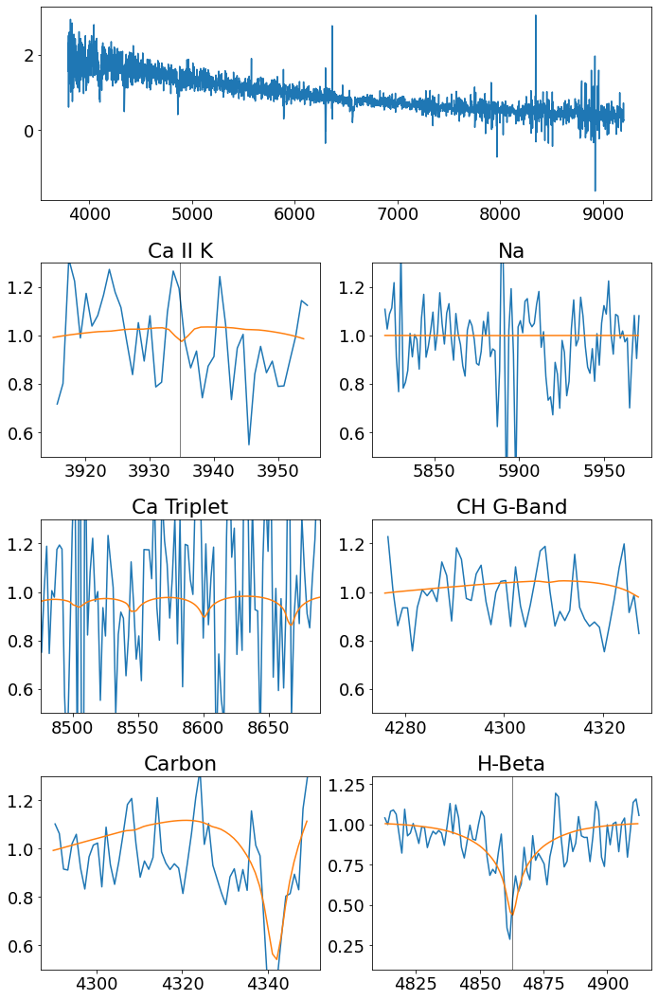

--------------------------------------------------
2655159296467489664
342.25538916334176 0.7422688393551271
1.4952068
sdA/F
19.17
6545.886566901778 4.117860958400053 -3.8999999998951047


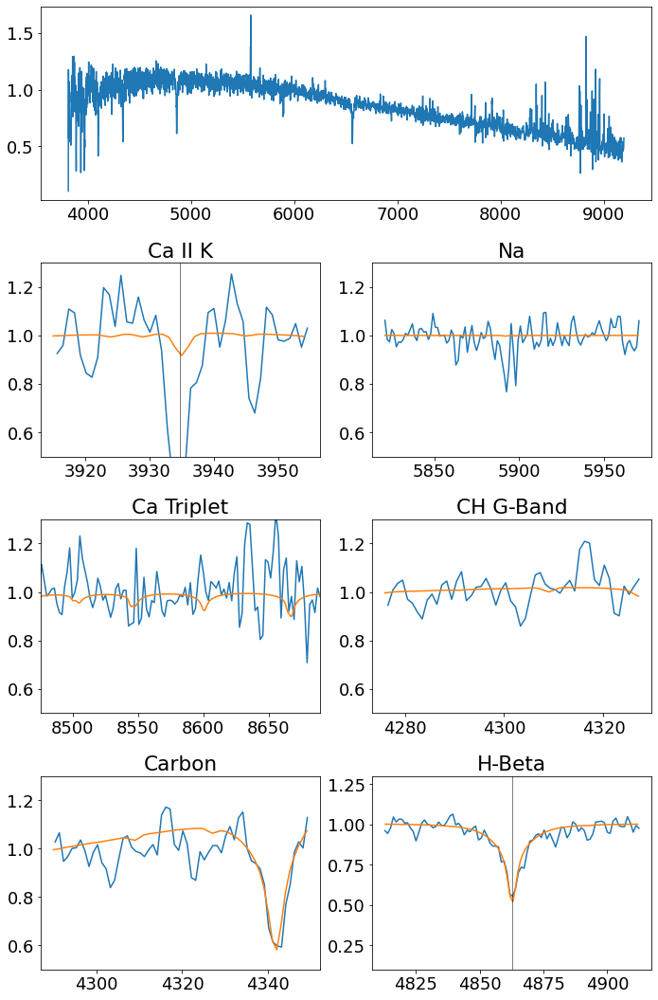

--------------------------------------------------
2425130949856825216
5.51527064894208 -10.168830058897921
2.1227734
sdA/F
19.187
6632.301248365778 4.1837544955655535 -3.7261225037235346


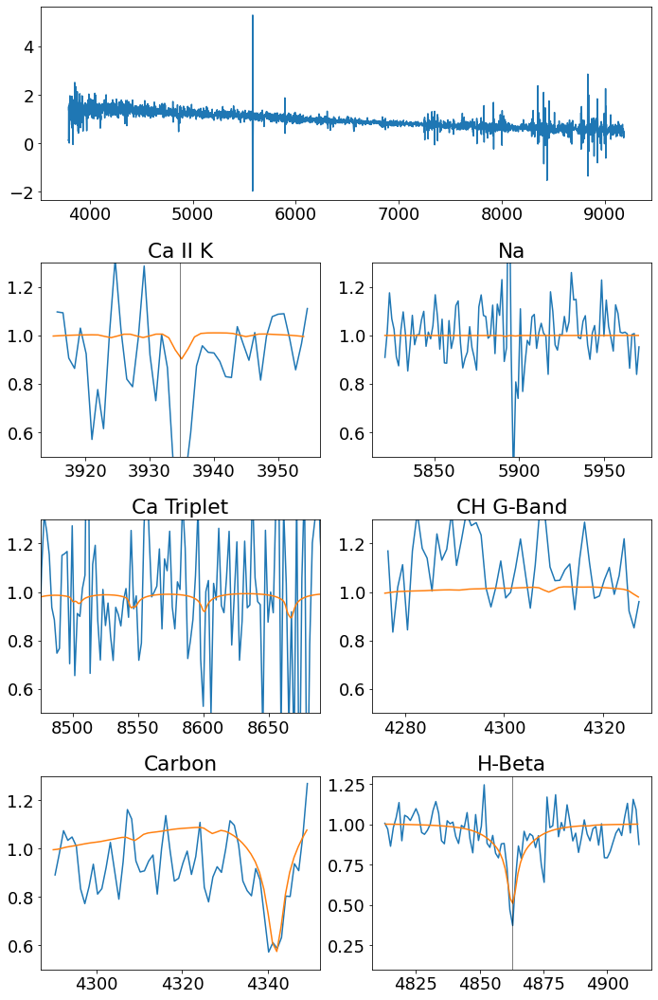

--------------------------------------------------
2687730026338432384
323.0177585184298 0.12628209648729388
1.3468887
sdA/F
19.248
6157.298540392534 4.030540126650116 -3.8999999998951047


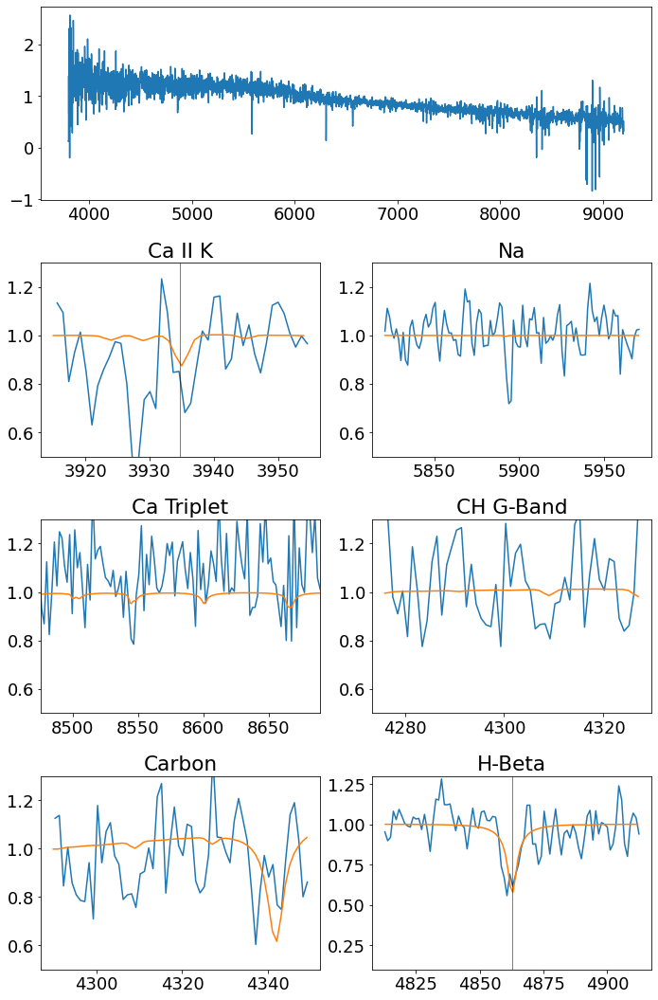

--------------------------------------------------
294129462193565824
18.681431162596063 24.948939513911196
3.5253935
sdA/F
18.041
5879.784409779624 4.027112611109281 -3.5893237593926615


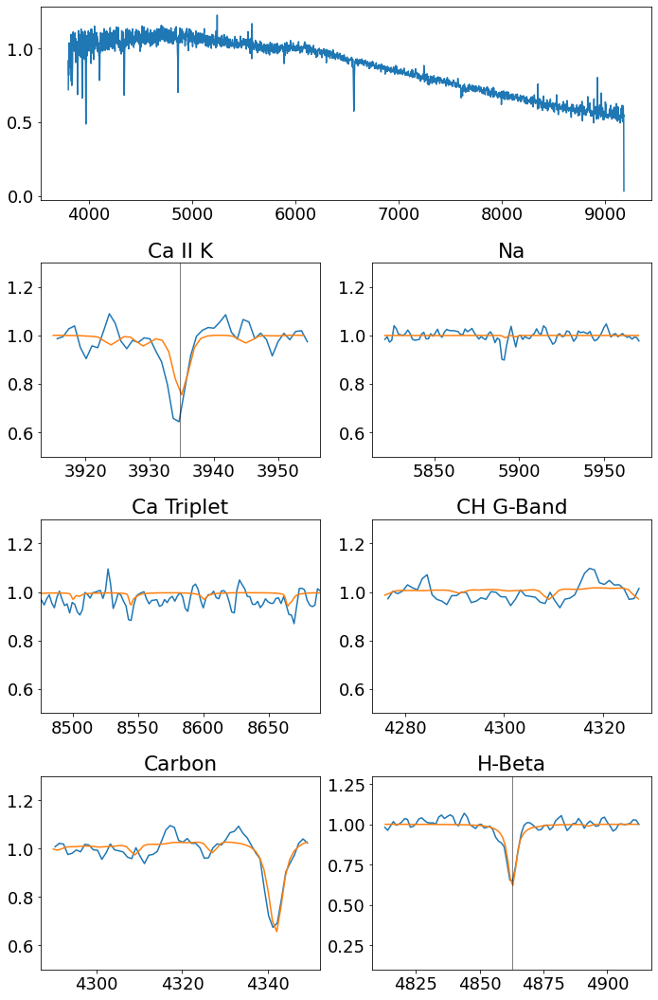

--------------------------------------------------
5176468479775127168
37.43243557325735 -8.83525675831314
0.8654729
sdA/F
19.697
6360.910423437805 4.999933510514335 -3.72297870777442


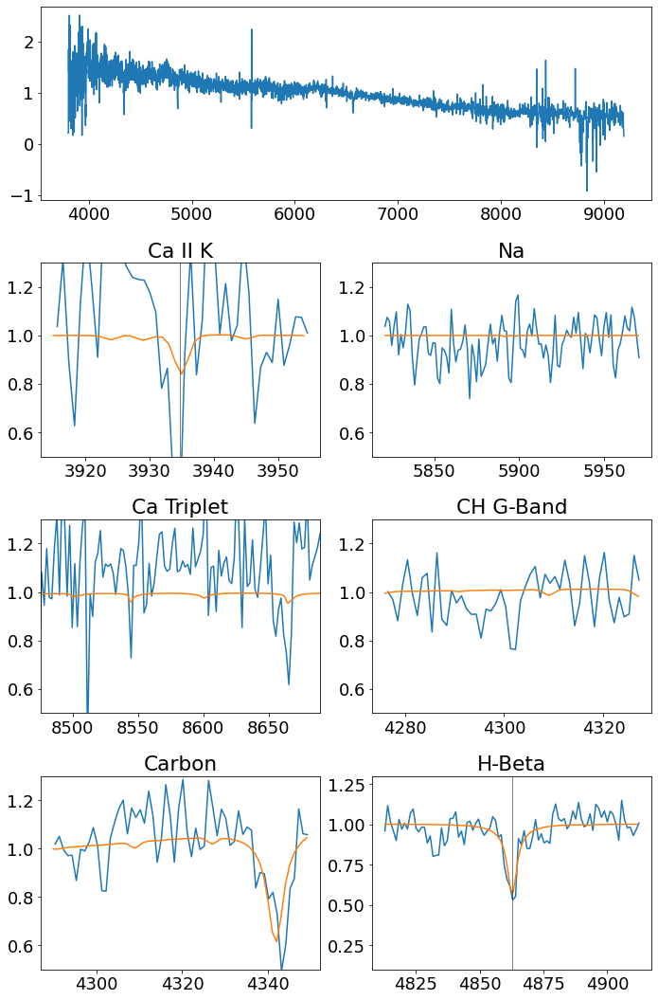

--------------------------------------------------
1781756737387836544
333.15487231075514 21.024983858240702
1.2865909
sdA
19.586
7304.838861484688 4.499998606452948 -3.8999999998951047


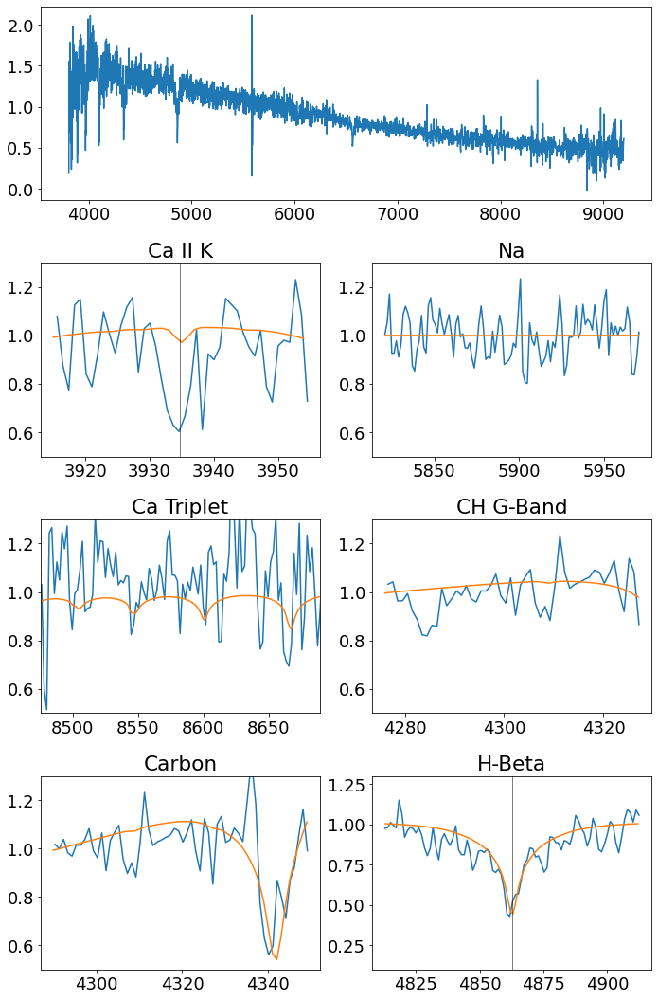

--------------------------------------------------
2837081501102067968
341.9369163170372 23.39098083352607
1.0753772
sdA/F
19.002
5927.984242251318 4.251350687396358 -3.5798599377829095


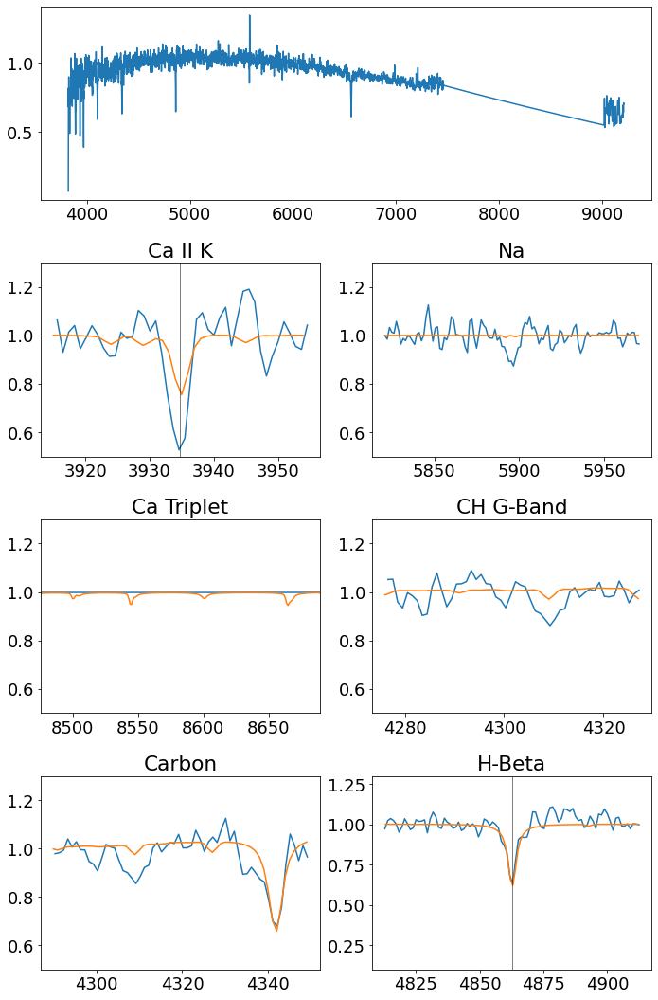

--------------------------------------------------
6898721537650947456
319.10487791240365 -7.106547059589974
1.093719
sdA/F
19.324
6269.68305151363 3.9999624707545096 -3.8999999998951047


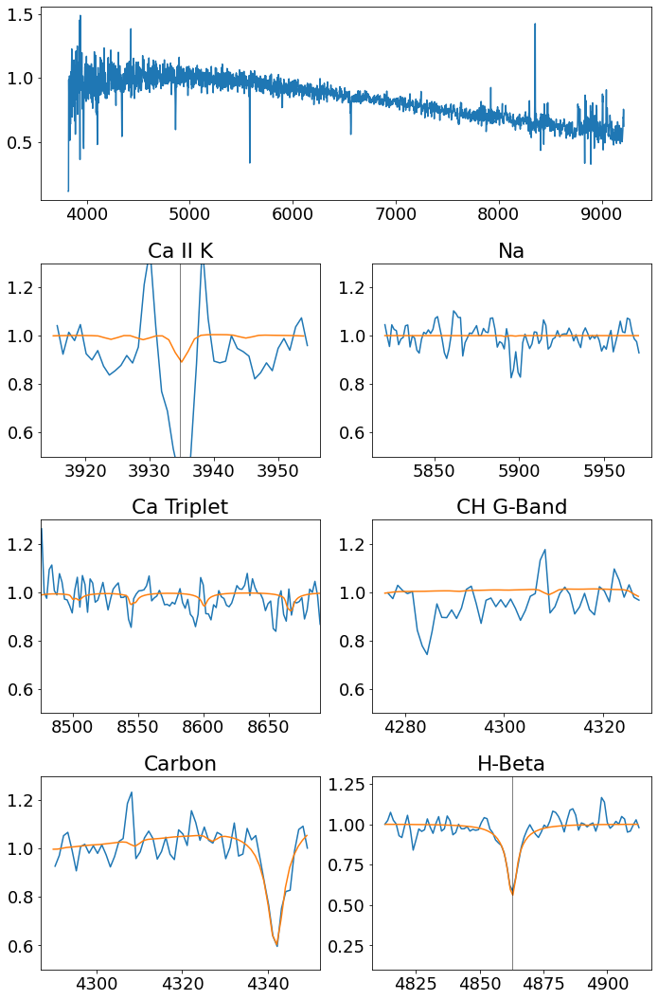

--------------------------------------------------
678760138785753728
127.10642066339135 24.855312840120405
2.4114912
sdA/F
19.053
5900.0000042537395 4.7525223936022645 -3.7438832739050043


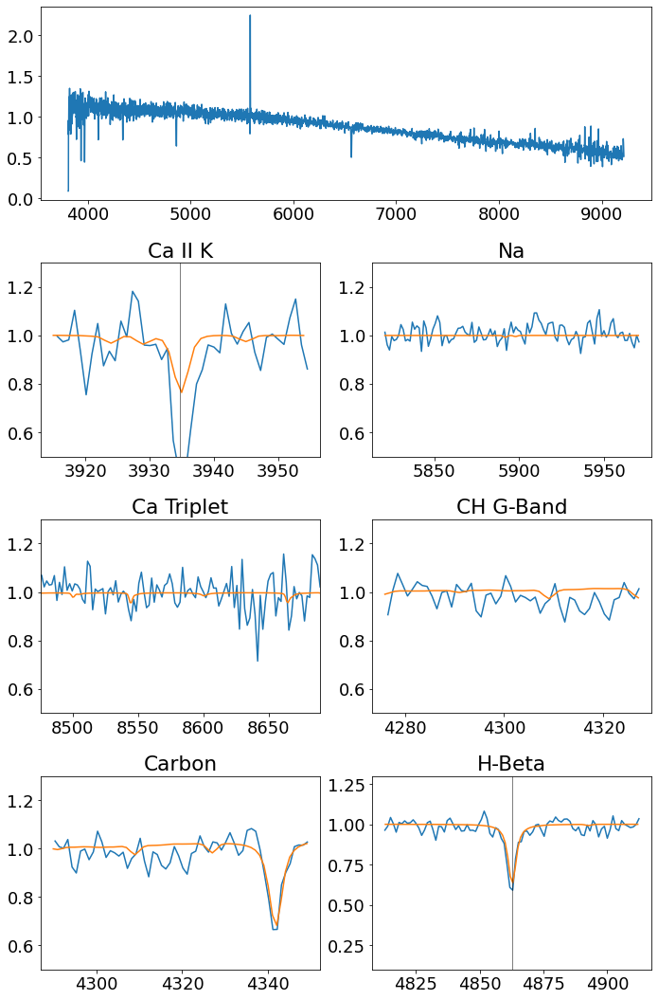

--------------------------------------------------
717083620868404736
133.40549423700108 36.181891877050205
1.4557595
sdA/F
17.866
6585.03139104464 4.101866190348542 -3.8999999998951047


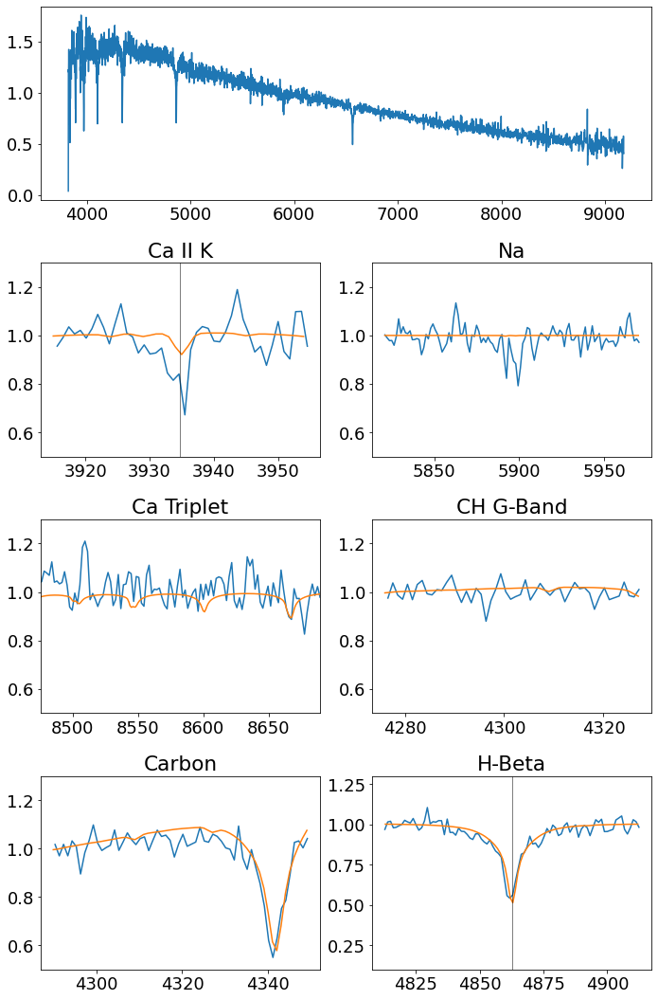

--------------------------------------------------
1019620464362986496
142.4290248903657 52.44674790743461
2.3724205
sdA/F
17.31
6442.664136273577 3.902406303685349 -3.8999999998951047


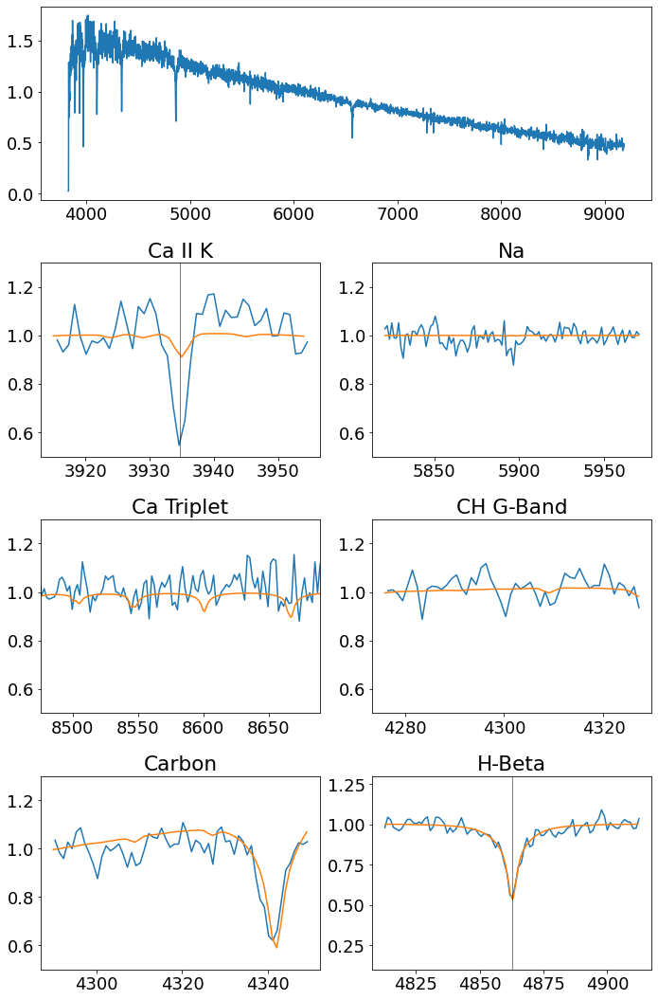

--------------------------------------------------
1220071982547250304
239.55657239793797 25.49923371814002
4.9403095
sdA/F
17.254
6653.878949116408 4.500008500923766 -3.843828618953814


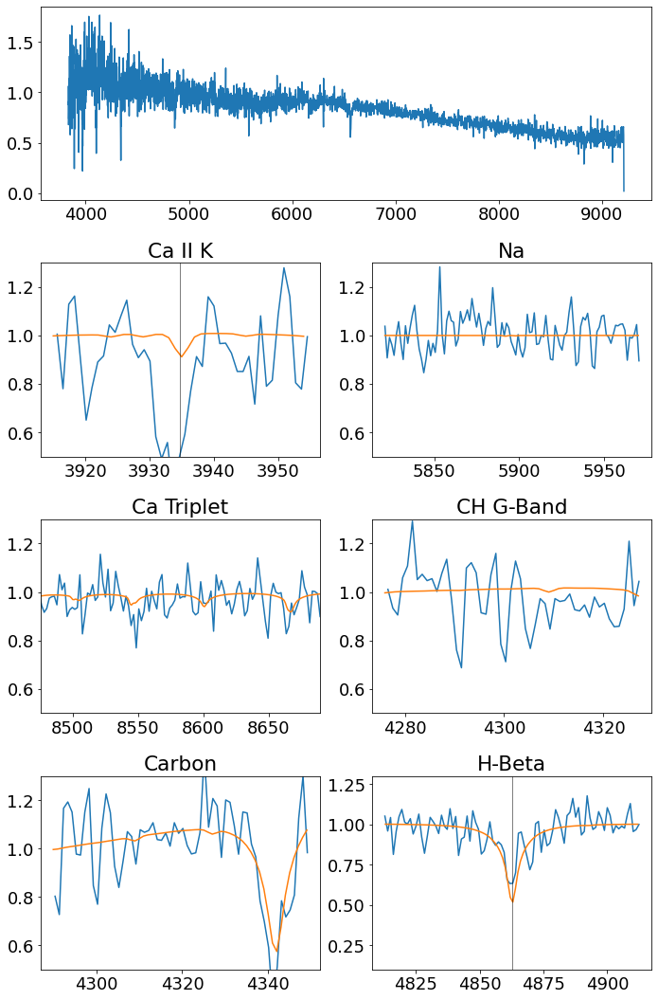

--------------------------------------------------
1220364207824968704
239.18340391705274 26.43921167203902
2.7824996
sdA/F
17.947
6257.260917266197 4.500014917041327 -3.8477599854856464


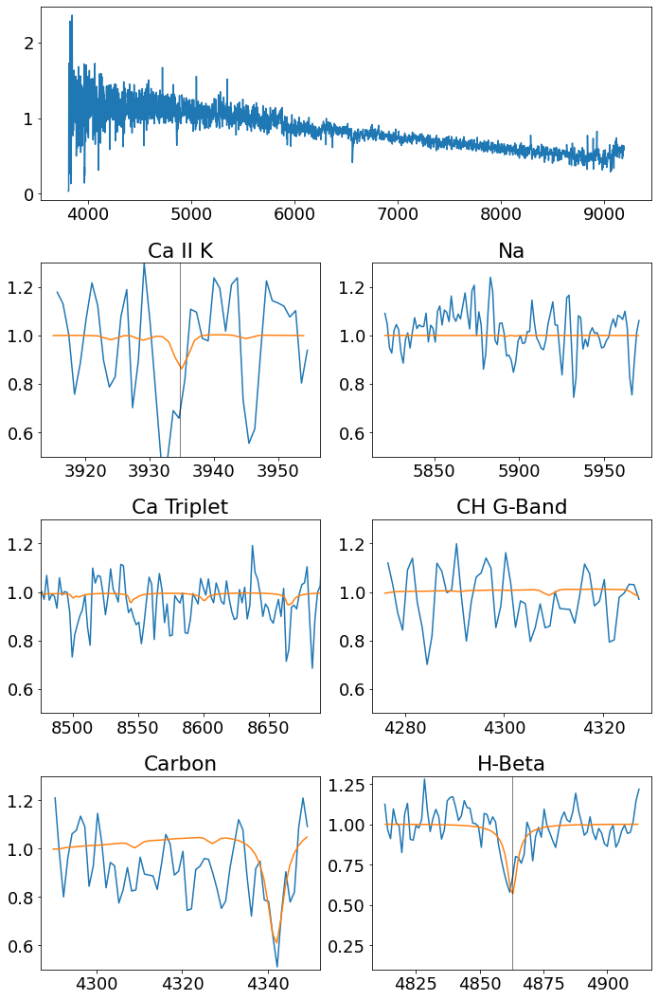

--------------------------------------------------
2190193215112479616
312.44583176984406 57.10016592546687
1.6570847
sdA
18.589000000000002
7999.999999958684 4.000000376311841 -3.8999999998951047


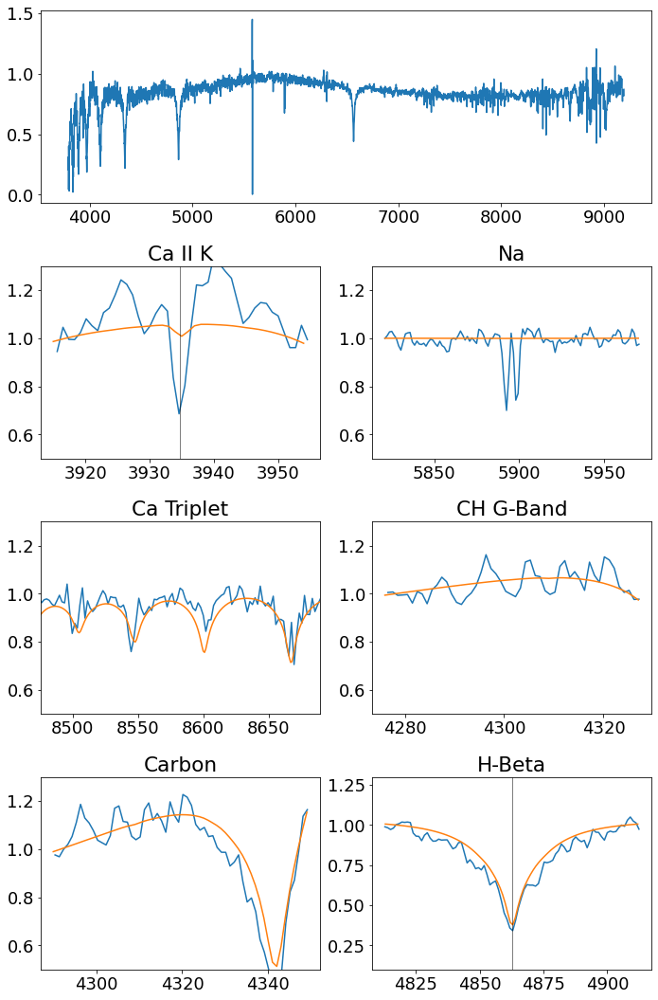

--------------------------------------------------
3294270771077682048
70.27025939755688 11.225728762067526
2.6796505
sdA/F
19.977999999999998
7999.999999660759 4.499999849549862 -3.8999999998951047


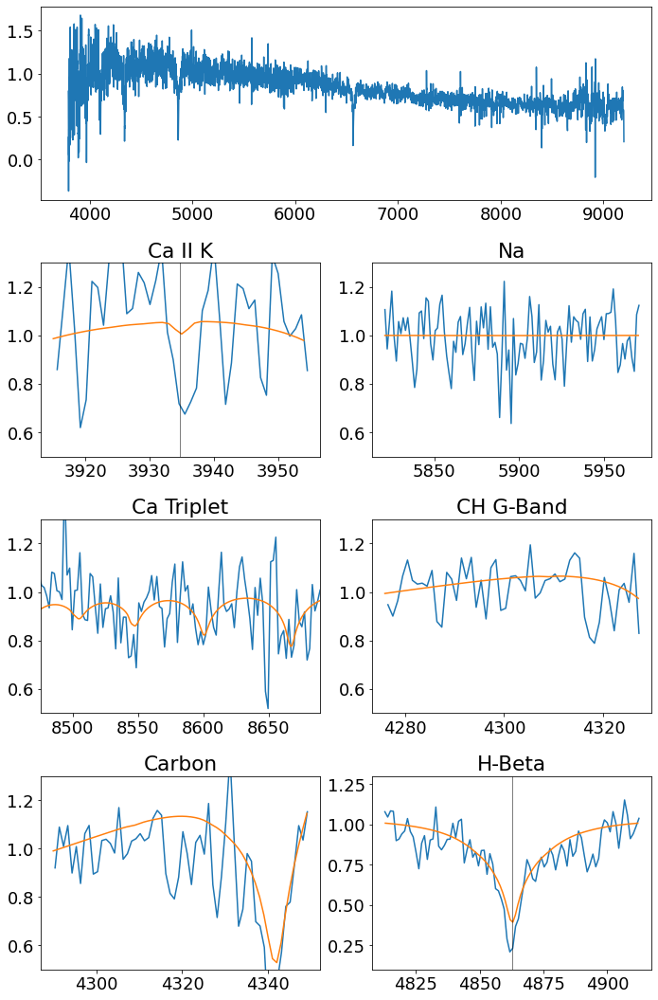

--------------------------------------------------
3675286356516693760
190.76734412346926 -8.208556428479481
1.6212885
sdA/F
18.269000000000002
5676.945890399273 4.172761082932874 -3.5871926722221517


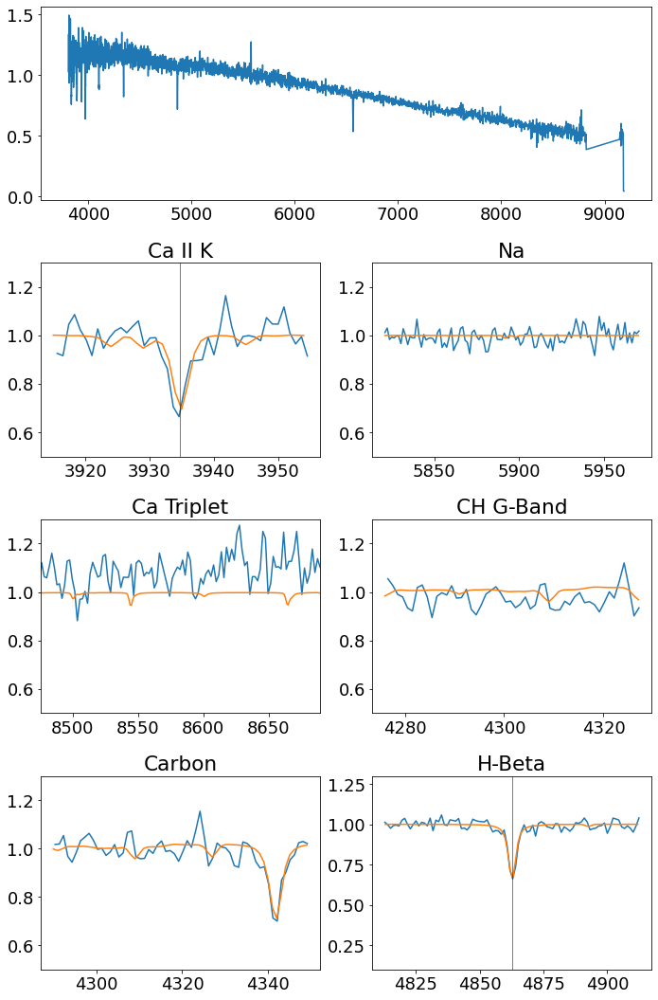

--------------------------------------------------
3675290685843535744
190.16788248280886 -8.591562287647866
0.65883374
sdA/F
19.759
6438.333723424735 4.2693284590412865 -3.8999999998951047


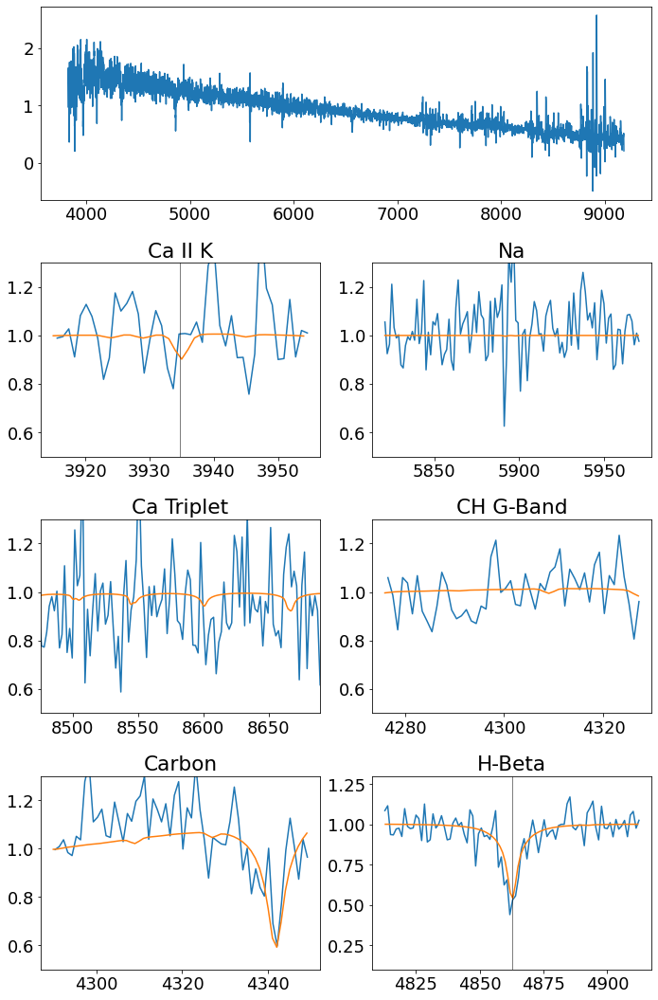

--------------------------------------------------
1256727943573743104
211.5258382624413 23.34077304474371
0.36505714
sdA/F
19.152
6579.527230963517 4.123478848612791 -3.8999999998951047


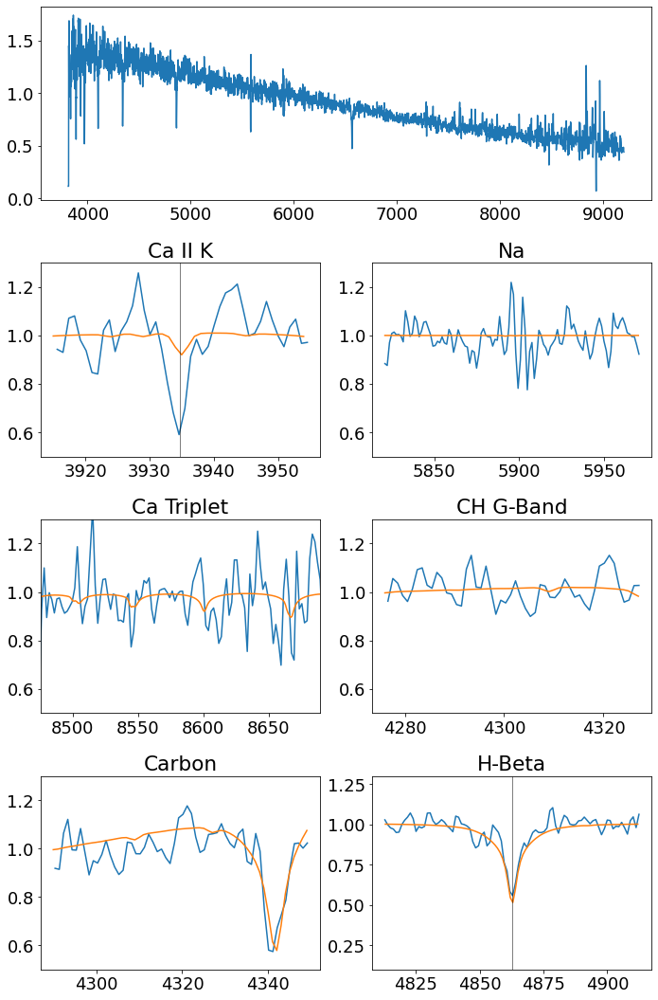

--------------------------------------------------
2110907534709771520
278.7293165847112 42.22470159006263
2.6499407
sdA/F
19.067
5600.0000335121495 4.9010835139429565 -3.8999999998951047


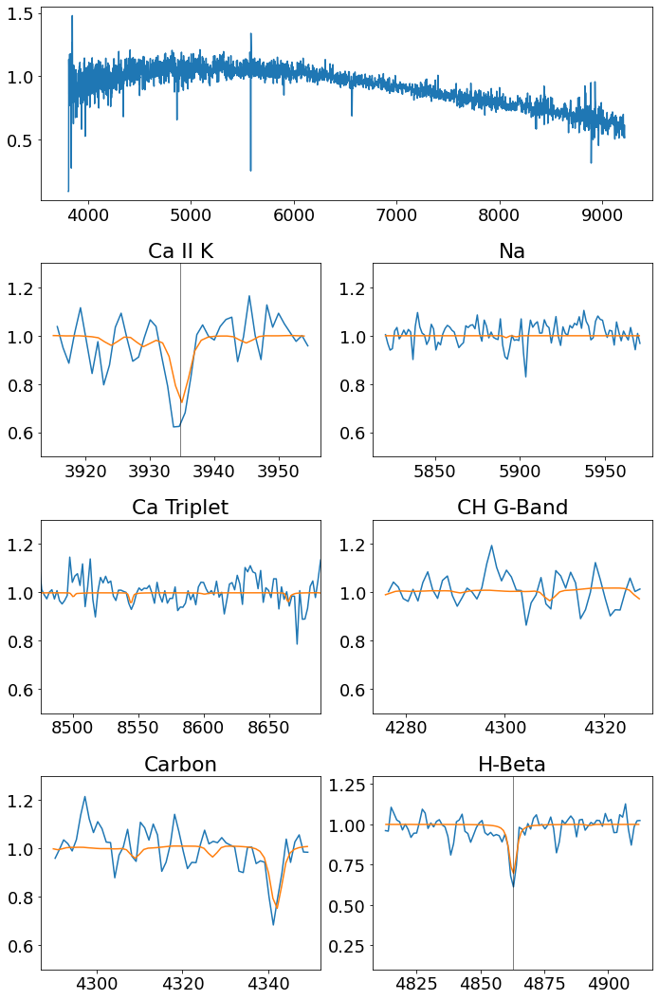

--------------------------------------------------
2848508484932021248
0.12603266838963192 24.385515953917132
0.13770844
sdA/F
19.294
6421.762904271343 3.850306634270959 -3.8999999998951047


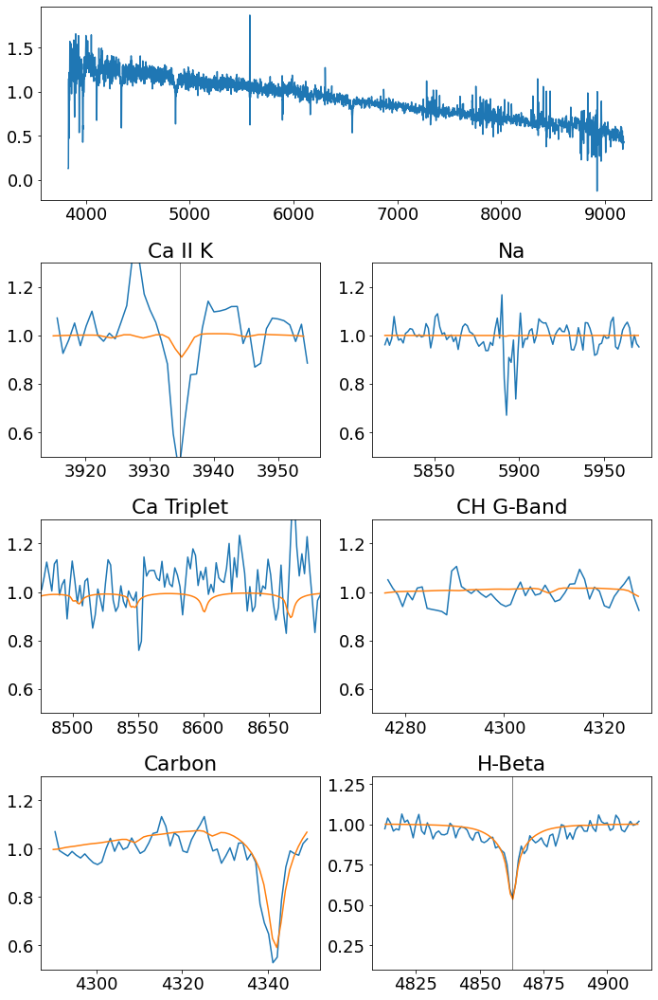

--------------------------------------------------
3890626773968983296
157.3130723393385 17.491073278450507
9.409157
sdA
16.928
5944.1377480828105 4.2667819015119095 -3.8999999998951047


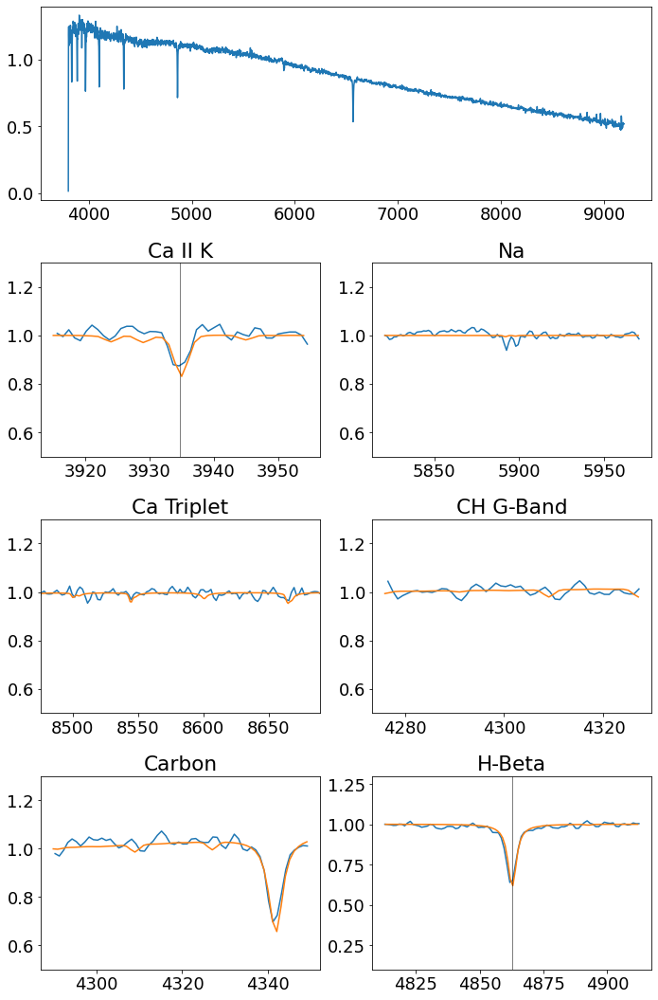

--------------------------------------------------
3686720731985206528
199.28694106714525 -0.4244511039037946
7.2778707
sdA/F
15.78
6357.037377933643 4.321023233239395 -3.6898694457093457


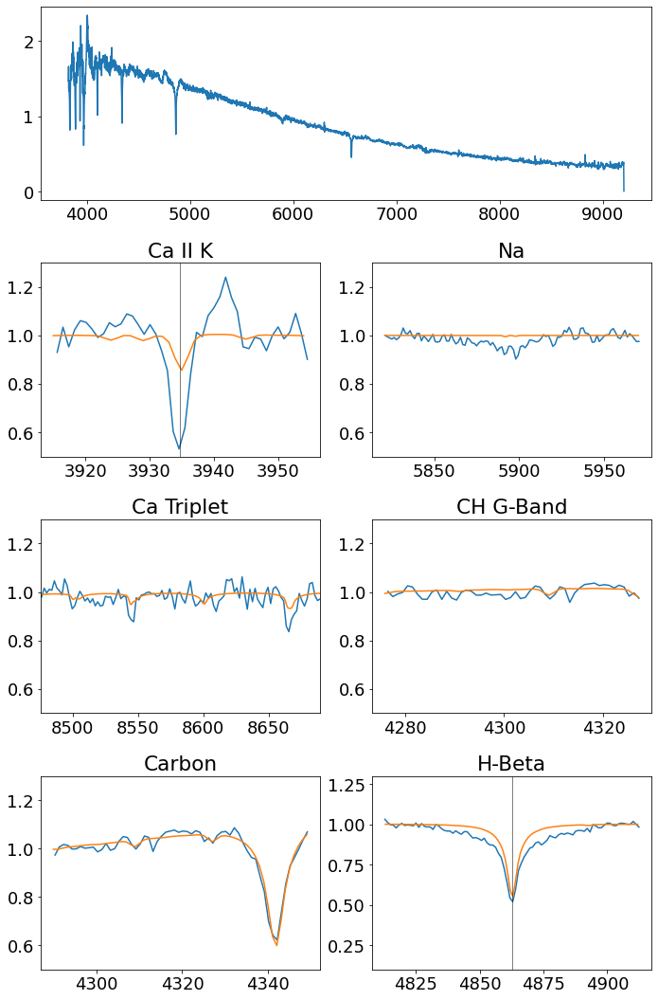

--------------------------------------------------
3686577207062776576
198.71404178774293 -1.062796306490615
0.52522266
sdA/F
19.456
6558.814818987839 4.212473522811884 -3.8999999998951047


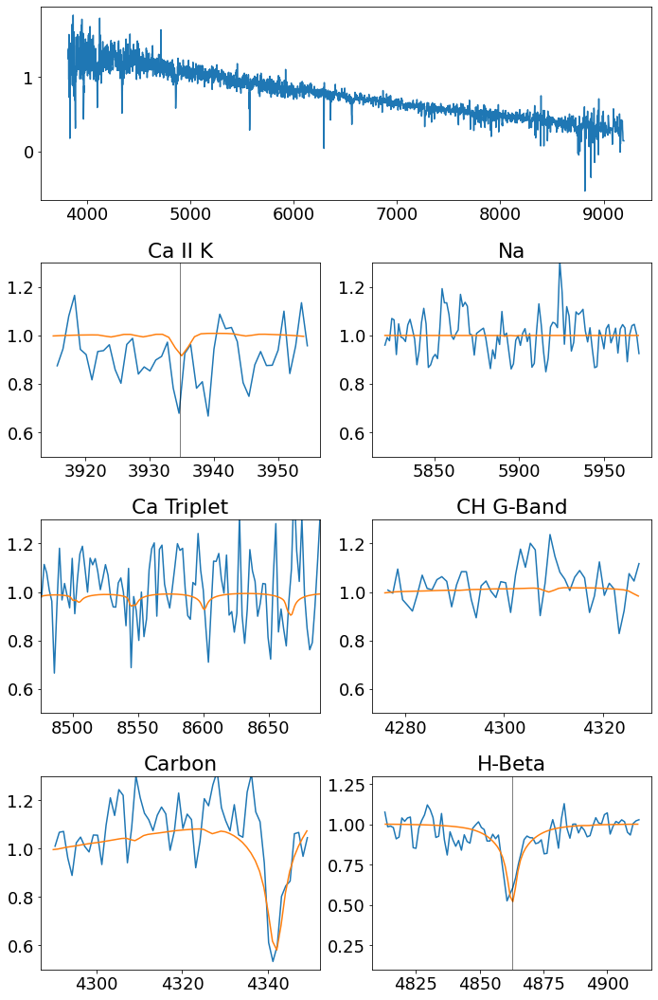

--------------------------------------------------
3725728582744864640
203.83669813813094 9.272725543149605
0.080926426
sdA/F
19.125999999999998
5700.004190493855 4.758752460176329 -3.676106852876868


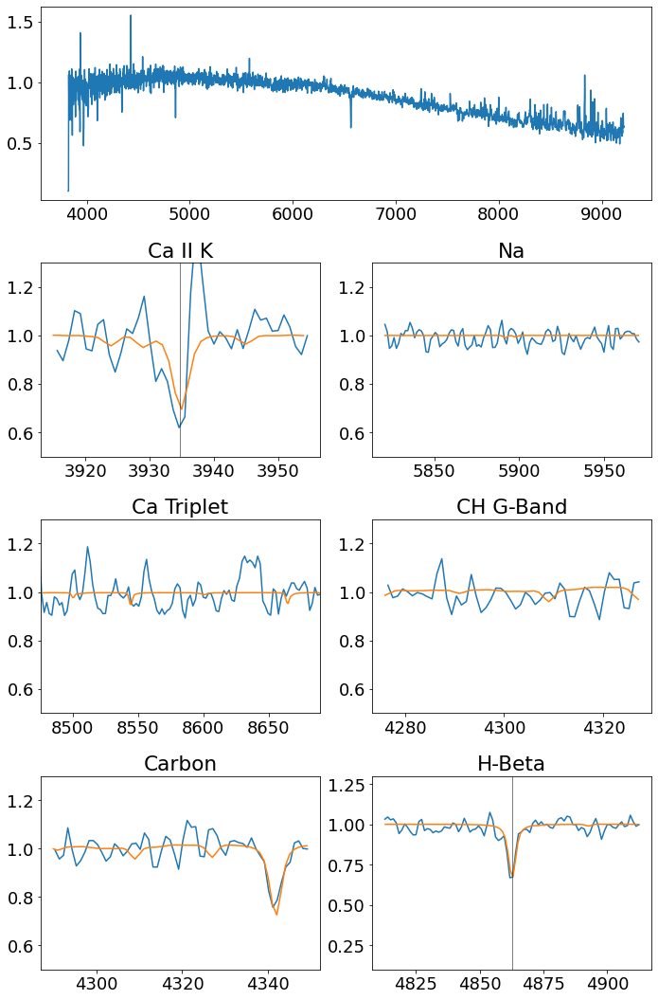

--------------------------------------------------
3734756363482453120
193.25659784460086 9.13165274317439
12.124332
DA
19.738
6951.771120886557 4.254383105214956 -3.8999999998951047


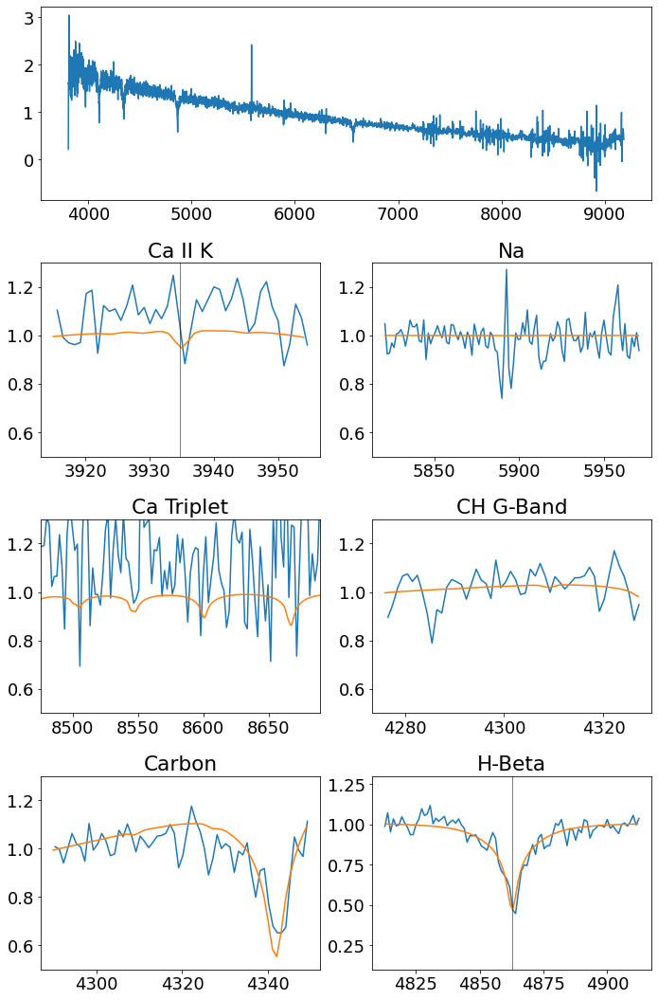

--------------------------------------------------
812991610680992384
142.99373316019484 39.47876805693297
0.2406434
sdA/F
19.439
6499.999017094421 4.411689323716876 -3.8999999998951047


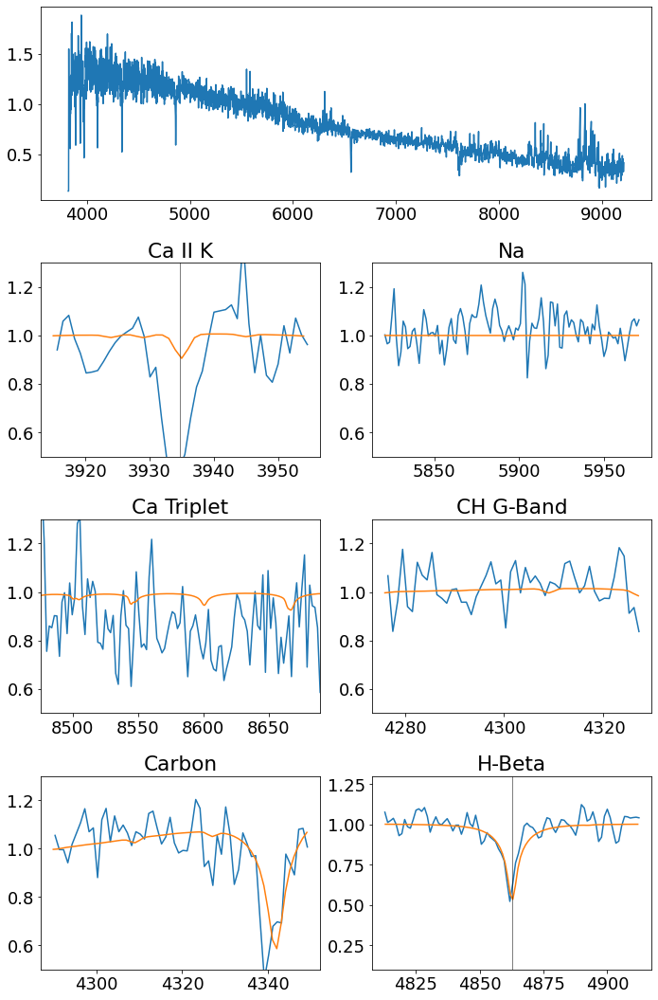

--------------------------------------------------
101509249938645760
37.73239706453111 23.108361727660487
0.9735465
sdA
19.758
6560.69147589452 4.24734331278034 -3.8999999998951047


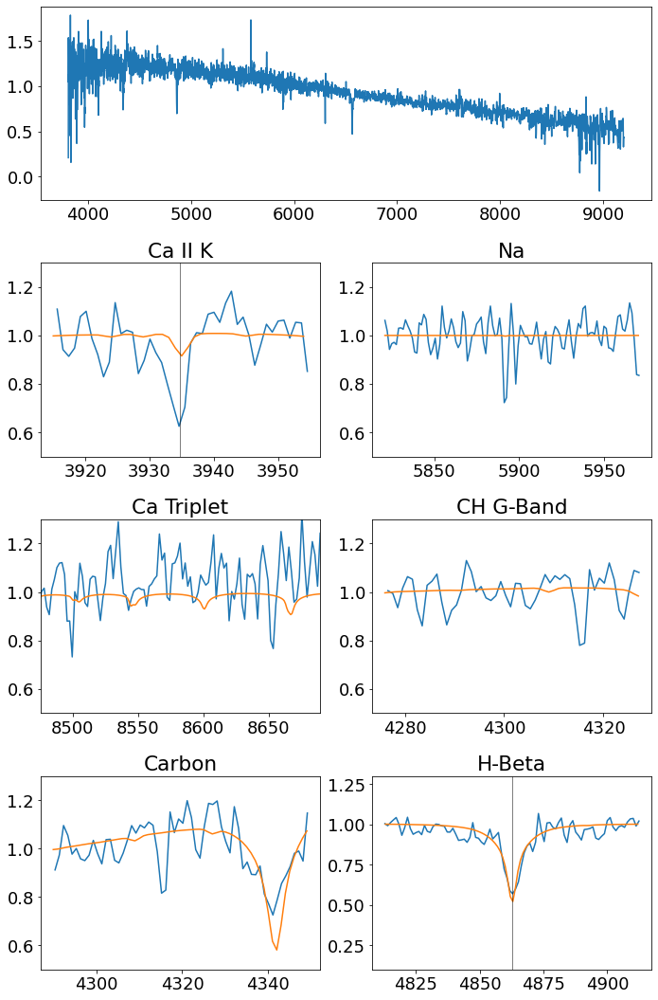

--------------------------------------------------
3701957450589635328
185.67936846160683 4.697926703072512
0.3268713
sdA/F
18.612000000000002
6466.627168557652 4.49996831274604 -3.5561981589117


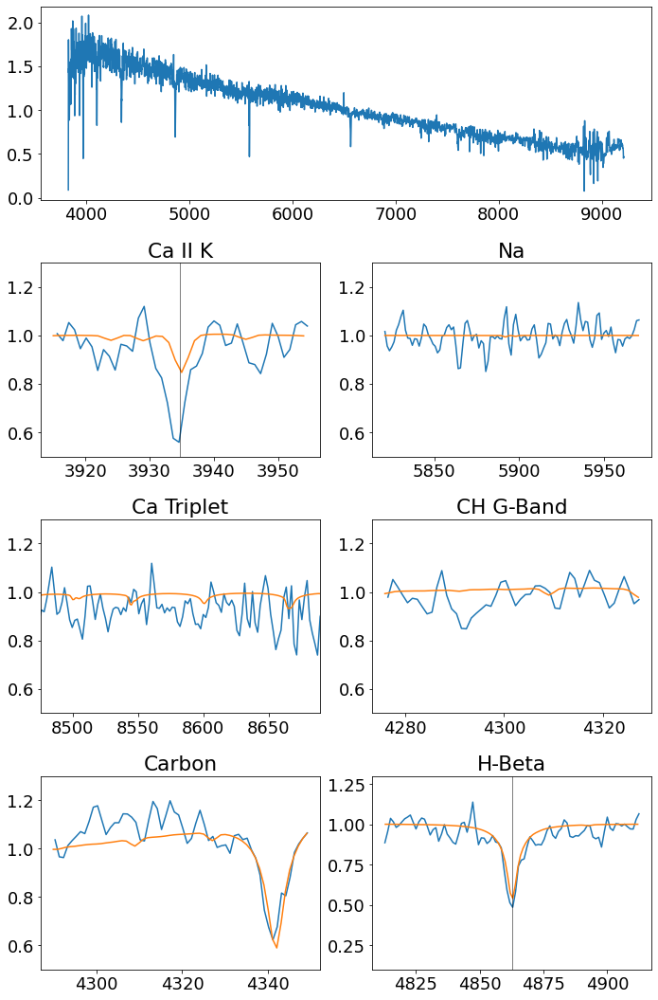

--------------------------------------------------
3698352804797263744
183.67760006378398 -0.1060958230931784
0.25368756
sdA/F
19.519000000000002
7290.9709946939265 4.403752436847039 -3.8999999998951047


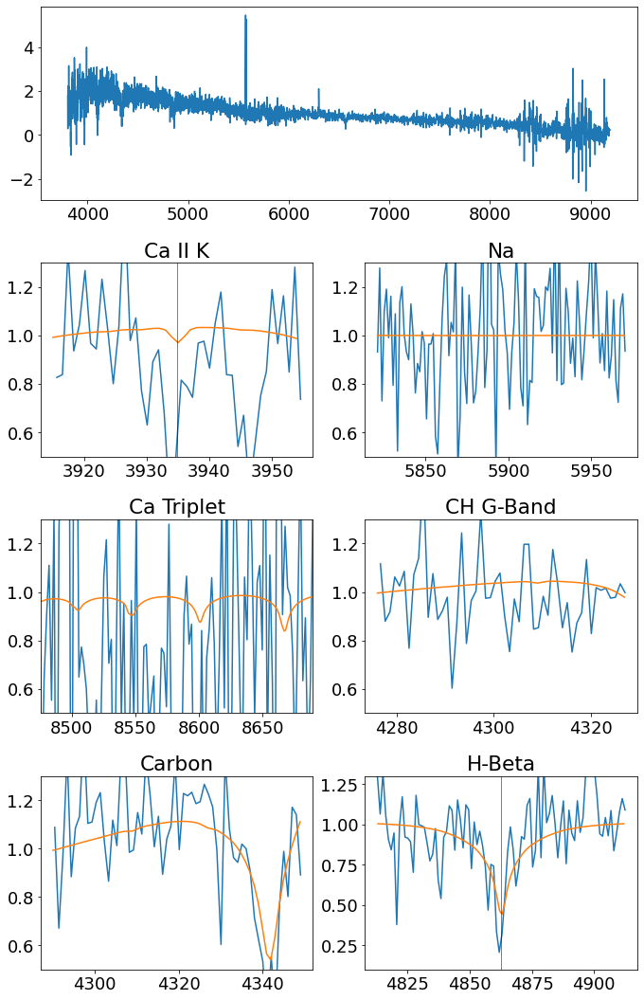

--------------------------------------------------
1555138663527703552
194.7512842196383 48.59512802615393
0.26685122
sdA/F
19.146
6765.522172686759 3.8278897786119948 -3.8999999998951047


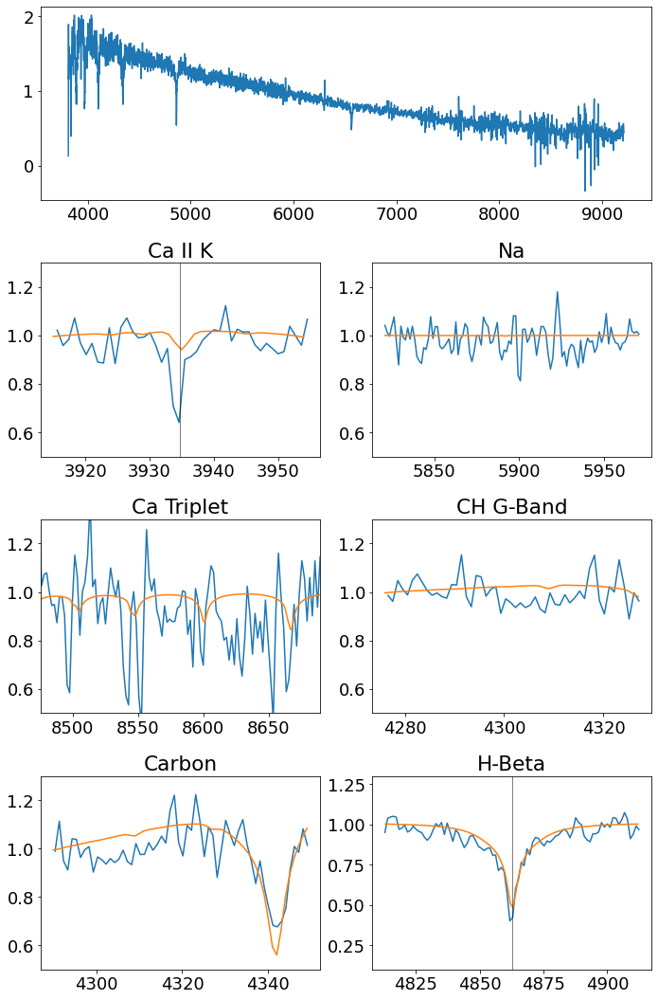

--------------------------------------------------
1173981412886626688
223.77850573750118 9.564129352344938
0.28282875
sdA
19.612000000000002
6199.999978228099 4.807458469097245 -3.8999999998951047


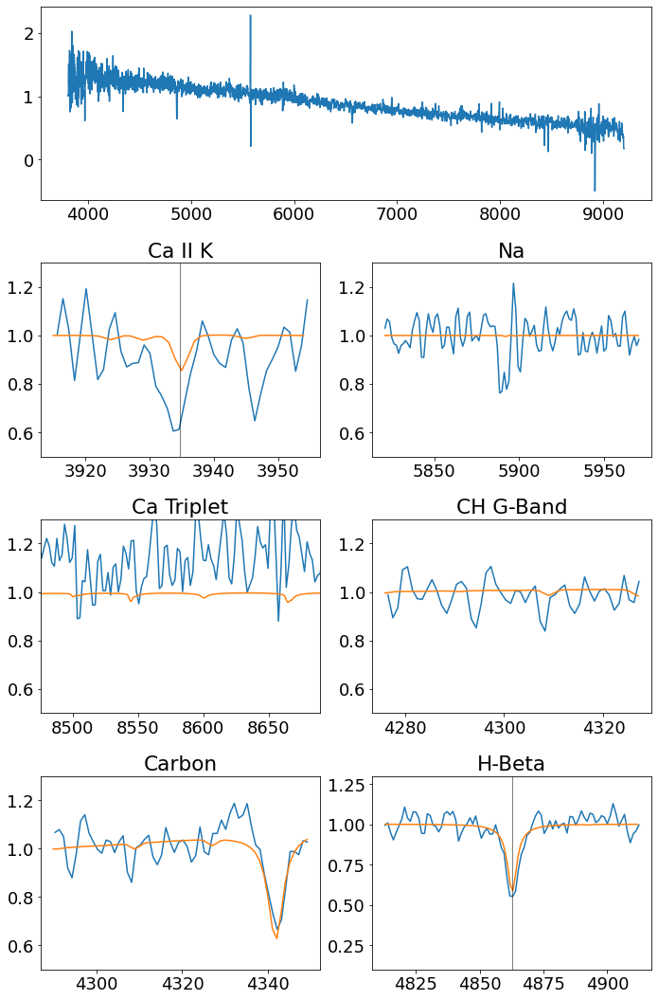

--------------------------------------------------
1586310367930667136
226.6734453696526 45.792258351617555
0.17981328
sdA/F
19.477
6570.69477676043 4.83564106437666 -3.722868312044679


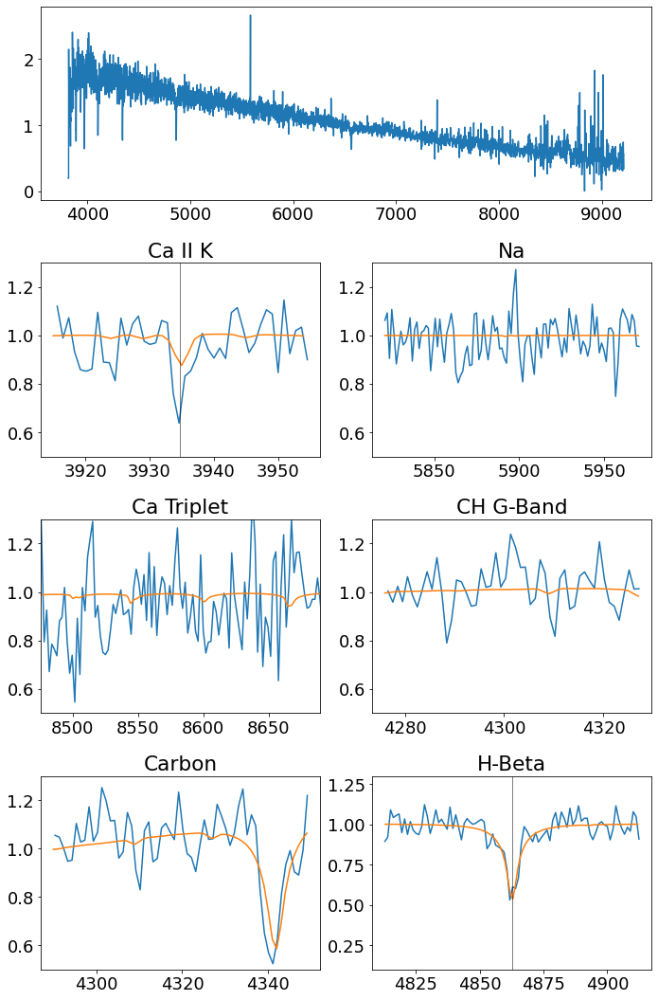

--------------------------------------------------
1398737120205642624
239.10861372341546 46.38900072468042
1.1892647
sdA
19.096
7037.921099994153 4.000003284504864 -3.8999999998951047


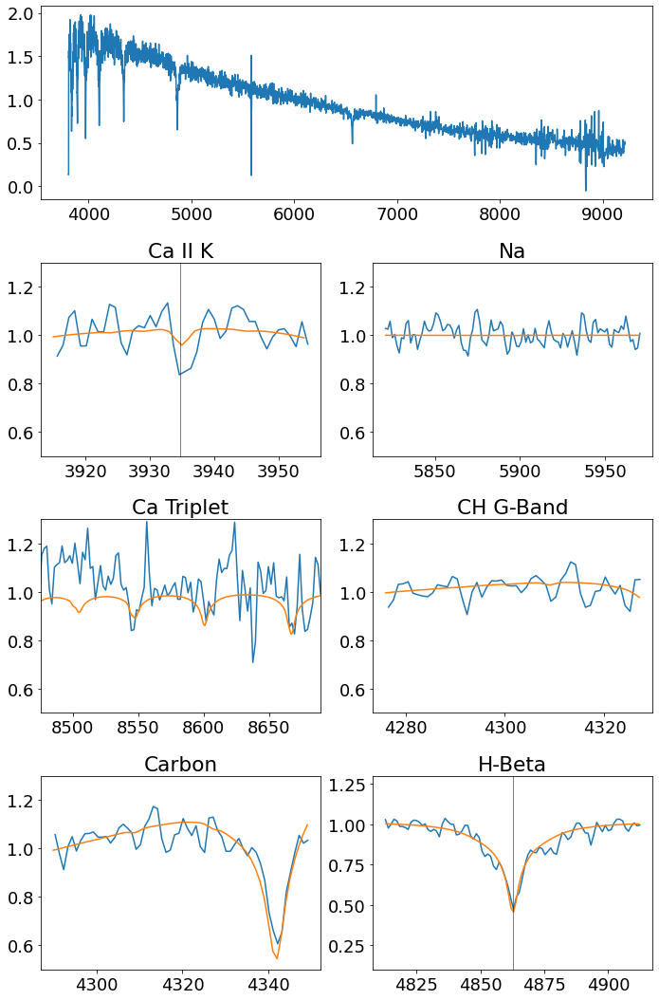

--------------------------------------------------
1372089051453190144
241.6343514981273 35.56363878055632
2.373209
sdA/F
17.634
6433.128340064057 4.1555845802541755 -3.521403473653333


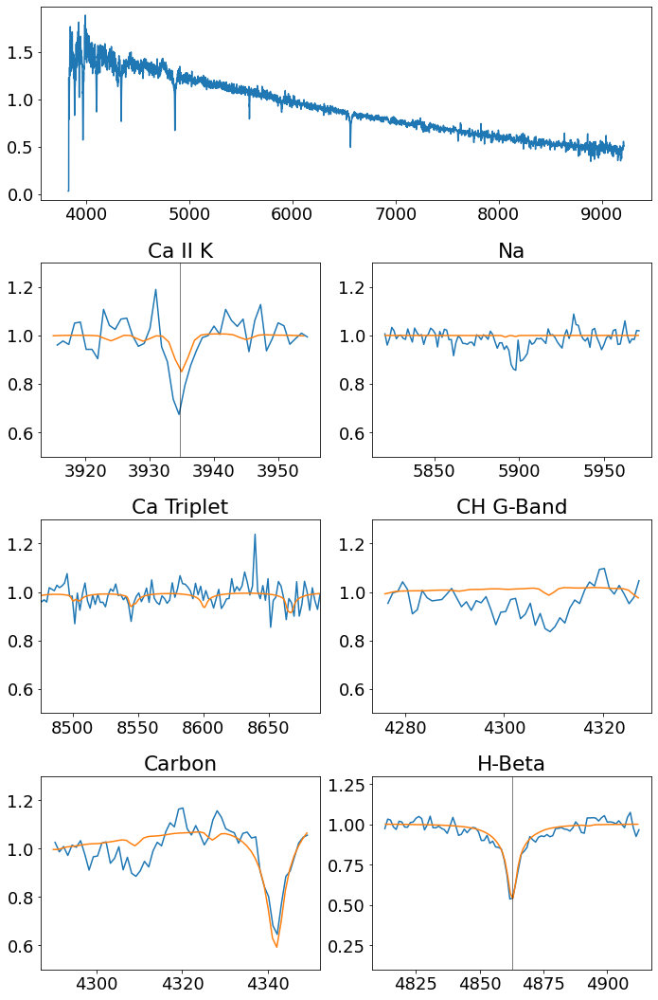

--------------------------------------------------
2542485193143859456
9.49757898691624 -1.1195982270150058
11.918874
DA
19.605999999999998
7043.348858066118 4.20393425232063 -3.8999999998951047


KeyboardInterrupt: 

In [15]:
for obj in table[emp]:
    print('-'*50)
    print(obj['source_id'])
    print(obj['ra'], obj['dec'])
    print(obj['parallax_over_error'])
    print(obj['ty'])
    print(obj['g'])
    print(obj['spec_teff'], obj['spec_logg'], obj['spec_feh'])
    
    wl, fl = get_spectrum(obj['source_id'])
    wl, fl = rv_corr(wl, fl)
    
    plot_metals(wl, fl, teff = obj['spec_teff'], logg = obj['spec_logg'], feh = obj['spec_feh'], alpha = 0)
    plt.show()

In [88]:
selection = [4450914642238765312,
2779812613335616384,
3927407606877041280,
1041117669033018112,
1543322422520153472,
926917477929764608,
2540804903154179840]

In [90]:
for src in table:
    if src['source_id'] in selection:
        wl, fl = get_spectrum(src['source_id'])
        print(src['source_id'])
        print(src['g-r'])
        print(src['ca2k'])
        wl, fl = rv_corr(wl, fl)
        
        print(src['spec_logg'])
        
        plot_metals(wl, fl, teff = src['spec_teff'], logg = src['spec_logg'], feh = src['spec_feh'])
        plt.show()

3927407606877041280
0.2579999999999991
0.9320024847984314
nan


ValueError: One of the requested xi is out of bounds in dimension 0

In [18]:
feh_selection = [
    
    3744674748639269120,
    1245593464196918272,
    1491162479953606656,
    2428250680957038976,
    764619215092561024,
    3725728582744864640,
    1398737120205642624,
    2520128999309983360,
    2548541852945056896,
    3905214200892445184
    
]

unknown = [
923068053360267136,
2572124320071981696,
4427787686456496128,
2434705943788272128,
1041117669033018112,
926917477929764608,
881205690025926400,
1543322422520153472,
2823062869583476224,
4448895182975654784,
1214202544663262848,
2757064989066940928,
2540804903154179840,
2294041061855802496]
##known
known = [
3092216989574463616,
290930261314166528,
2779958921396953088,
1276882477044162688,
4190837398756490112,
2782111559005651584,
1184737183522291712,
3740963179636227968,
3976087728282022272,
3890626773968983296,
]

In [19]:
selection = np.array([sourceid in feh_selection for sourceid in table['source_id']])

In [20]:
selection

array([False, False, False, ..., False, False, False])

(array([3., 0., 0., 0., 2., 2., 0., 2., 0., 1.]),
 array([-3.9       , -3.67337375, -3.4467475 , -3.22012125, -2.99349501,
        -2.76686876, -2.54024251, -2.31361626, -2.08699001, -1.86036376,
        -1.63373751]),
 <a list of 10 Patch objects>)

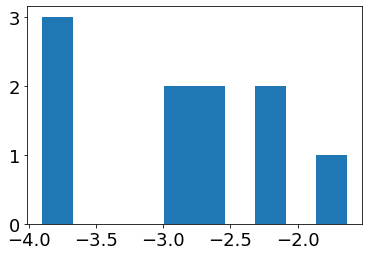

In [21]:
plt.hist(table[selection]['spec_feh'])

(array([2., 1., 1., 1., 1., 3., 0., 0., 0., 1.]),
 array([0.08092643, 0.42795607, 0.77498573, 1.1220154 , 1.469045  ,
        1.8160747 , 2.1631043 , 2.510134  , 2.8571637 , 3.2041934 ,
        3.551223  ], dtype=float32),
 <a list of 10 Patch objects>)

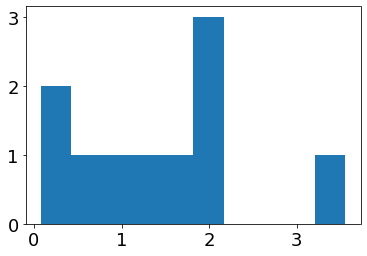

In [22]:
plt.hist(table[selection]['parallax_over_error'])

--------------------------------------------------
1491162479953606656
217.00102362077232 40.97335069403332
2.1617062
sdA/F
18.11
6478.968053031285 4.4998938940004 -2.73834943101994


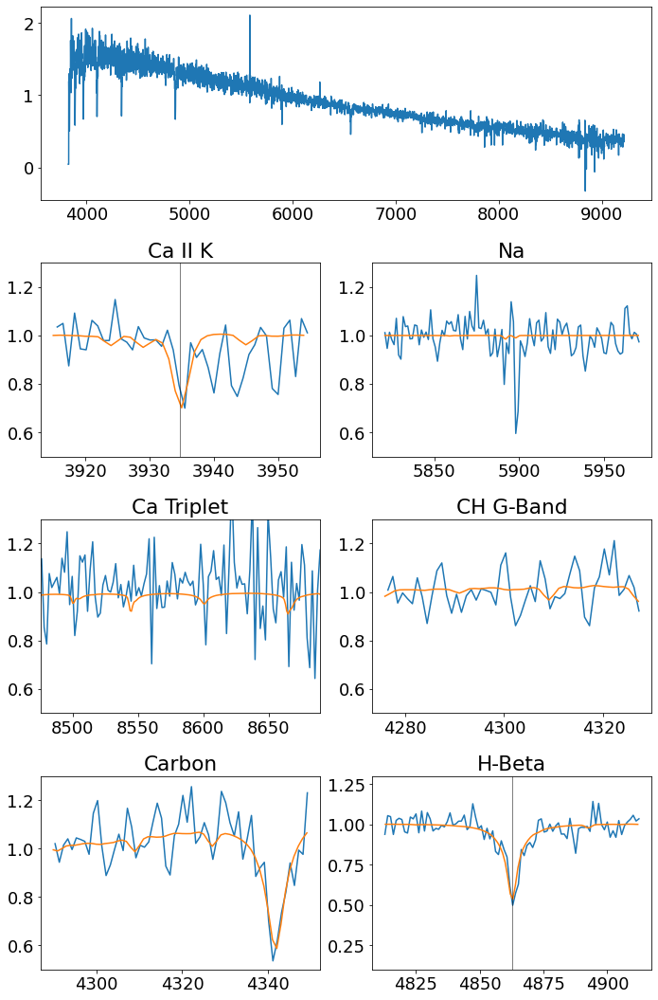

--------------------------------------------------
2428250680957038976
4.8977643674360865 -9.535043475287738
1.8523897
sdA/F
17.551
6477.998407082302 3.9999771225415155 -2.227924363595274


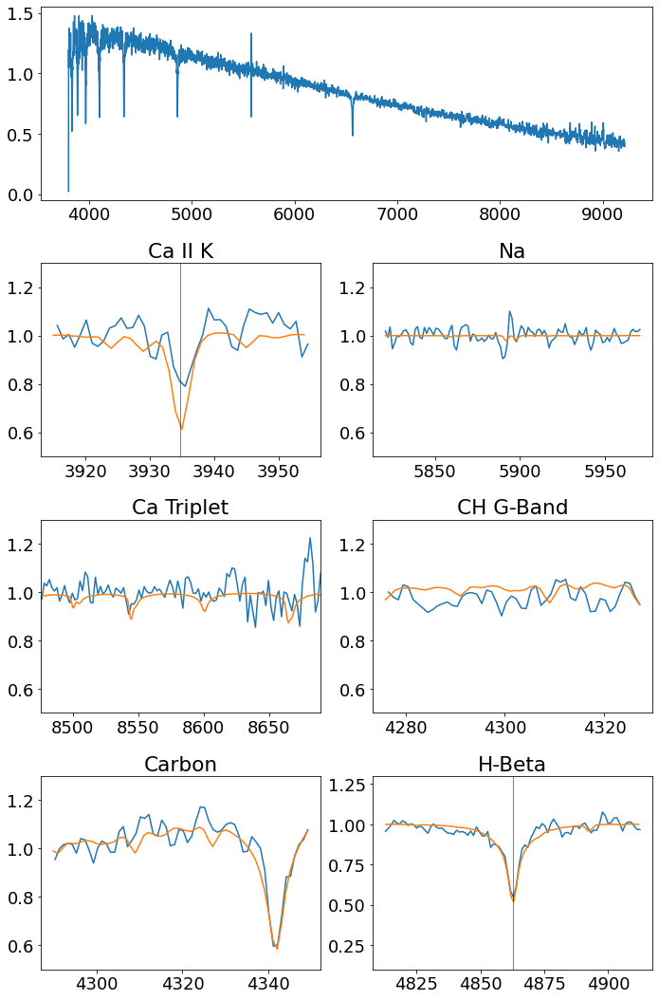

--------------------------------------------------
3744674748639269120
199.31894122106513 16.145659901355664
3.551223
sdA/F
17.66
6474.833736650221 3.720461107959823 -1.6337375128525187


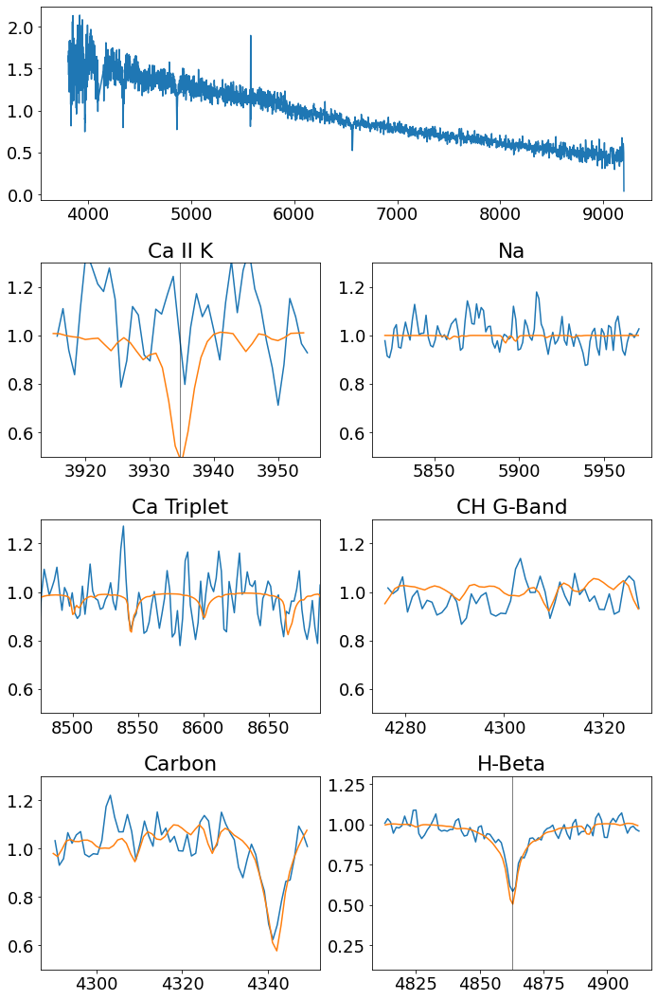

--------------------------------------------------
764619215092561024
167.32524028297368 38.38810074435306
1.4970384
sdA/F
19.265
6171.215716106923 3.642523788313498 -2.6146455172238925


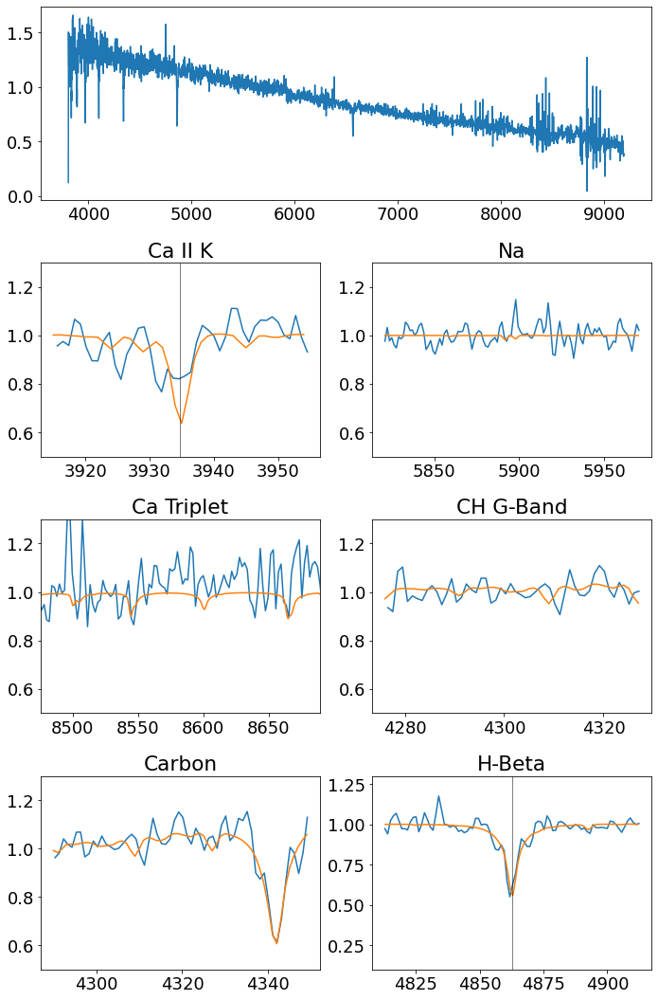

--------------------------------------------------
3725728582744864640
203.83669813813094 9.272725543149605
0.080926426
sdA/F
19.125999999999998
5700.004190493855 4.758752460176329 -3.676106852876868


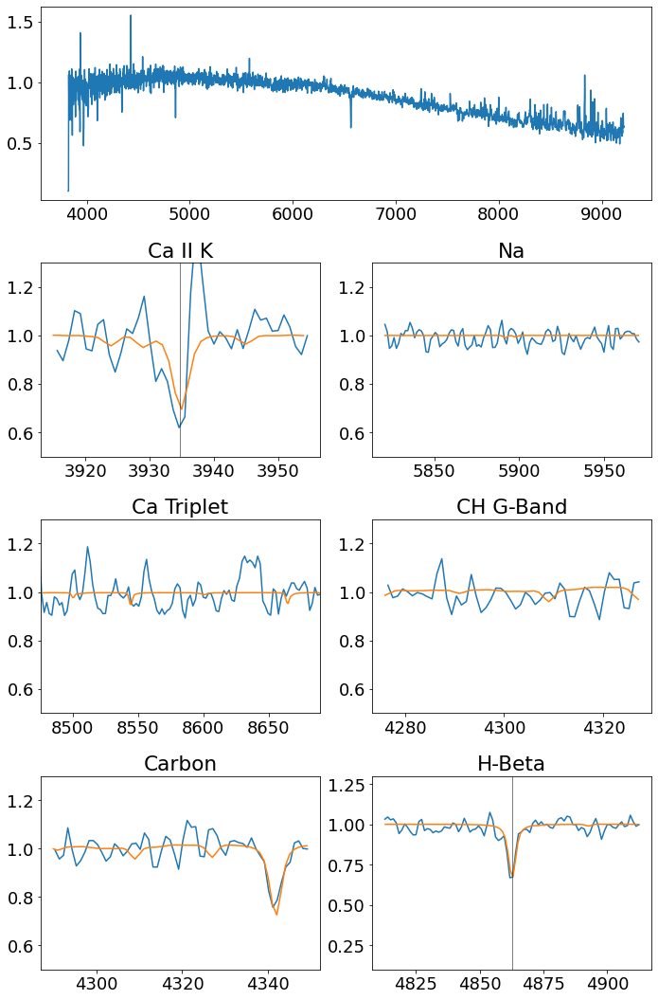

--------------------------------------------------
1245593464196918272
210.56684405427004 18.368039740306724
0.35943332
sdA/F
19.514
6328.20526776471 4.174173607900421 -2.8116694790804875


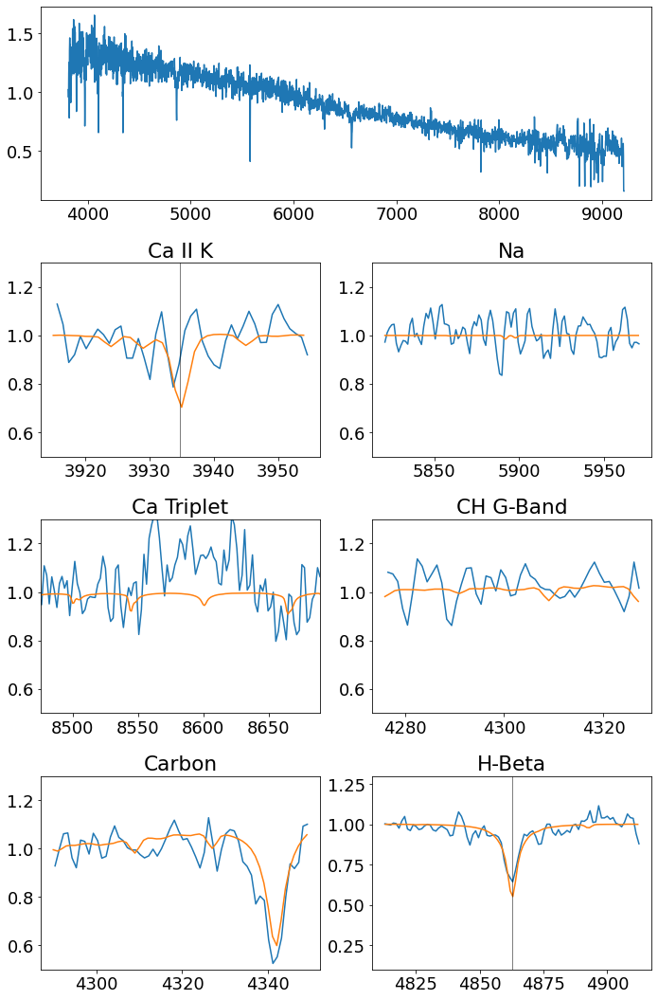

--------------------------------------------------
1398737120205642624
239.10861372341546 46.38900072468042
1.1892647
sdA
19.096
7037.921099994153 4.000003284504864 -3.8999999998951047


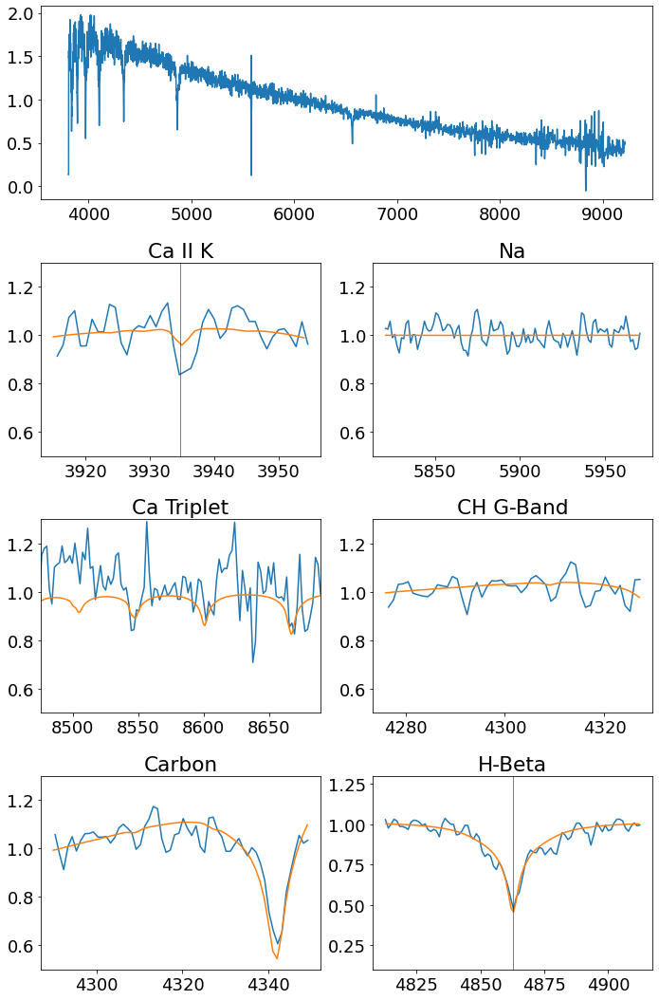

--------------------------------------------------
2548541852945056896
5.808359778127079 3.132784308202946
1.9180169
sdA/F
17.910999999999998
6377.705704919112 4.018502690672459 -2.285713266525505


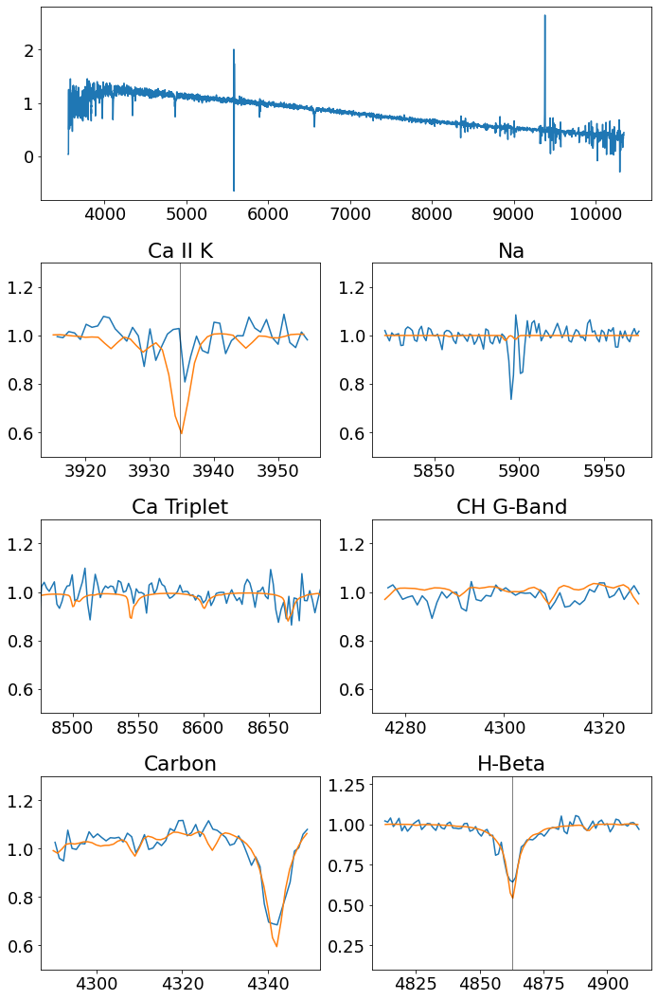

--------------------------------------------------
3905214200892445184
184.32488257411586 8.869568917053613
0.961729
sdA
19.366
6214.658093993632 4.1650092895990625 -2.8803032233120343


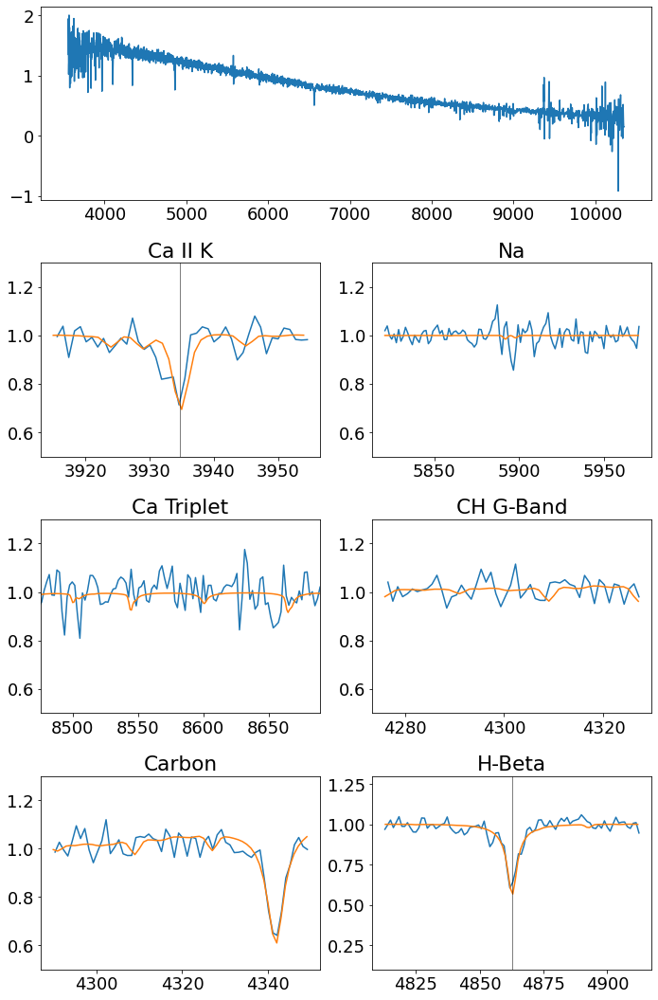

--------------------------------------------------
2520128999309983360
32.9673576085339 6.045638646736119
0.4340495
sdA/F
19.158
6029.196596447562 3.539405689098946 -3.8999999998951047


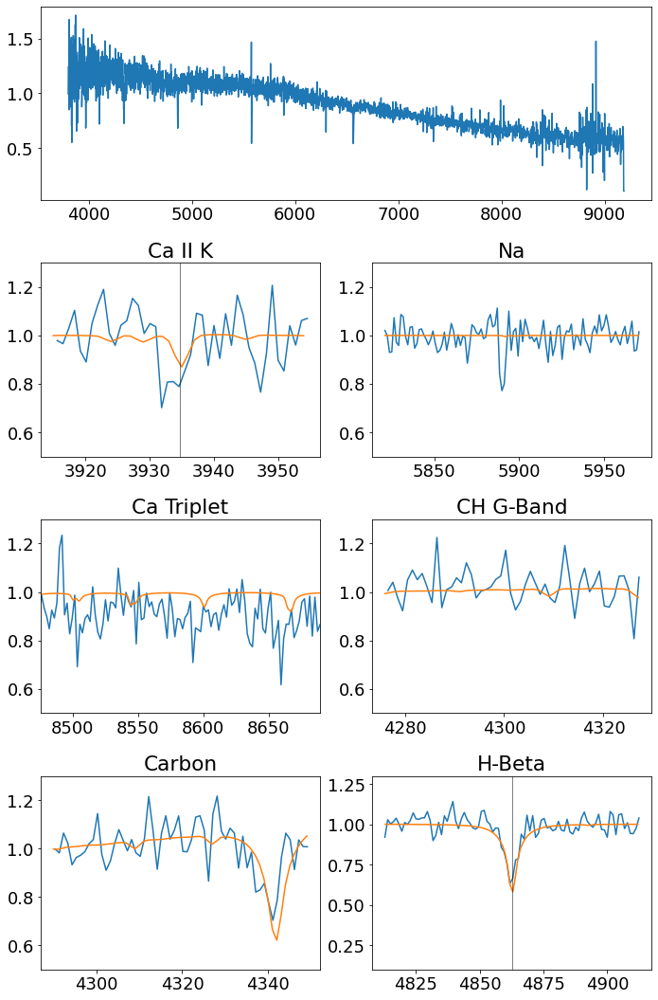

In [23]:
for obj in table[selection]:
    print('-'*50)
    print(obj['source_id'])
    print(obj['ra'], obj['dec'])
    print(obj['parallax_over_error'])
    print(obj['ty'])
    print(obj['g'])
    print(obj['spec_teff'], obj['spec_logg'], obj['spec_feh'])
    
    wl, fl = get_spectrum(obj['source_id'])
    wl, fl = rv_corr(wl, fl)
    
    plot_metals(wl, fl, teff = obj['spec_teff'], logg = obj['spec_logg'], feh = obj['spec_feh'], alpha = 0)
    plt.show()